In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


In [3]:
%cd /content/drive/MyDrive/Time\ Series\ Project
!ls

/content/drive/MyDrive/Time Series Project
 Kobe_temperature.ipynb  'Simulation AR(1).ipynb'	  timegan_utils.py
 Kobe_weather.csv	  Simulation_other_series.ipynb
 __pycache__		  timegan_utils2.py


In [4]:
#importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
%matplotlib inline
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.ar_model import AutoReg
from sklearn.preprocessing import MinMaxScaler
import importlib
import timegan_utils

In [5]:
np.random.seed(0)

n = 2000

def generate_arma11(phi, theta, n, burn_in = 200, sigma = 1):
  totalLength = n + burn_in

  #Empty box and normal error to create series
  series = np.zeros(totalLength)
  epsilon = np.random.normal(0, sigma, totalLength)

  #ARMA(1, 1) creation
  for t in range(1, totalLength):
    series[t] = phi * series[t-1] + epsilon[t] + theta * epsilon[t-1]

  #Reducing the initial effect
  return series[burn_in:]

def generate_arma12(phi, theta1, theta2, n, burn_in=200, sigma=1):
    totalLength = n + burn_in

    # Empty box and normal error to create series
    series = np.zeros(totalLength)
    epsilon = np.random.normal(0, sigma, totalLength)

    # ARMA(1, 2) creation
    for t in range(2, totalLength):
        series[t] = (
            phi * series[t-1]
            + epsilon[t]
            + theta1 * epsilon[t-1]
            + theta2 * epsilon[t-2]
        )

    # Reducing the initial effect
    return series[burn_in:]

def generate_trend_seasonality(n, trendSlope = 0.006, seasonalAmplitude = 2, seasonalPeriod = 50, phi = 0.3, theta = 0.2, sigma = 0.5, burn_in = 200):
  t = np.arange(n)

  #Simulation using linear and trigonometric fucntion
  trend = trendSlope * t
  seasonality = seasonalAmplitude * np.sin(2 * np.pi * t / seasonalPeriod)

  #Noise Component
  correlatedNoise = generate_arma11(phi = phi, theta = theta, n = n, burn_in = burn_in, sigma = sigma)

  series = trend + seasonality + correlatedNoise

  components = {
      "Trend": trend,
      "Seasonality": seasonality,
      "Correlated Noise": correlatedNoise
  }

  return series, components

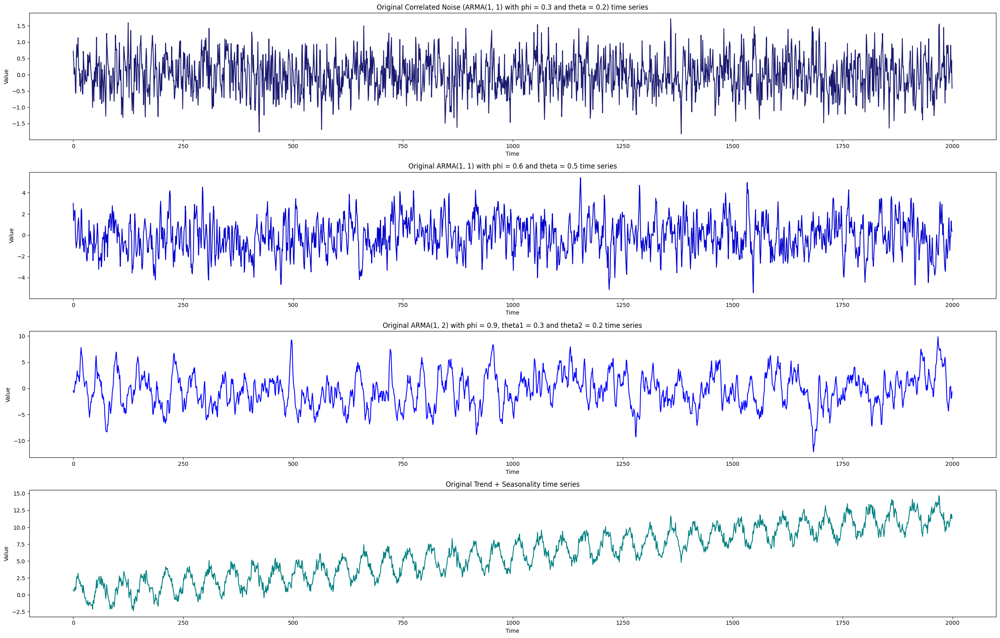

In [6]:
#ARMA(1, 1) with phi = 0.6 and theta = 0.5
arma1 = generate_arma11(phi = 0.6, theta = 0.5, n = n)
#ARMA(1, 2) with phi = 0.9, theta1 = 0.3, theta2 = 0.2
arma2 = generate_arma12(phi = 0.9, theta1 = 0.3, theta2 = 0.2, n = n)
trendSeasonalSeries, trendSeasonalComponents = generate_trend_seasonality(n = n)

#Preparing both ARMA(1, 1) and trend/seasonality
originalSeries = {
    "Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)": trendSeasonalComponents["Correlated Noise"],
    "ARMA(1, 1) with phi = 0.6 and theta = 0.5": arma1,
    "ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2": arma2,
    "Trend + Seasonality": trendSeasonalSeries
}

seriesNames = list(originalSeries.keys())
colorsOrig = ['midnightblue', 'mediumblue', 'blue', 'teal']

fig, axes = plt.subplots(4, 1, figsize = (25, 16))

#Plotting the series
for i, name in enumerate(seriesNames):
  axes[i].plot(originalSeries[name], color = colorsOrig[i])
  axes[i].set_title(f'Original {name} time series')
  axes[i].set_xlabel('Time')
  axes[i].set_ylabel('Value')

plt.tight_layout()
plt.show()

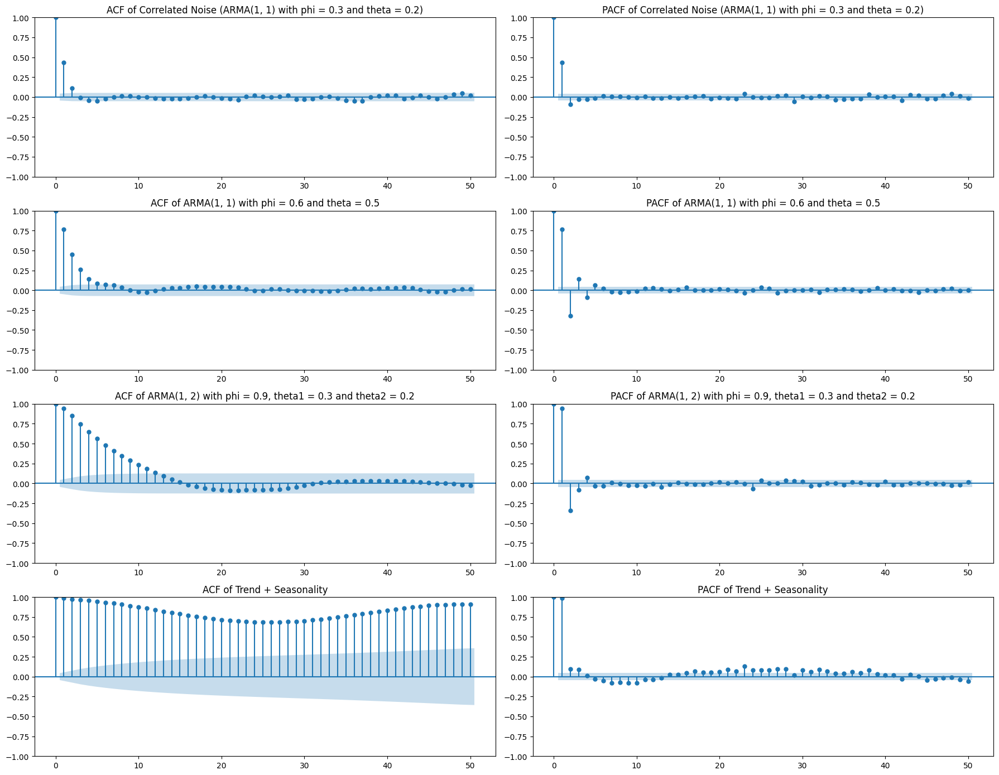

In [7]:
fig, axes = plt.subplots(4, 2, figsize = (18, 14))

#Plotting ACF/PACF
for i, name in enumerate(seriesNames):
  plot_acf(originalSeries[name], ax = axes[i, 0], lags = 50)
  axes[i, 0].set_title(f'ACF of {name}')

  plot_pacf(originalSeries[name], ax = axes[i, 1], lags = 50)
  axes[i, 1].set_title(f'PACF of {name}')

plt.tight_layout()
plt.show()

In [8]:
stationarySeries = {
    "Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)": trendSeasonalComponents["Correlated Noise"],
    "ARMA(1, 1) with phi = 0.6 and theta = 0.5": arma1,
    "ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2": arma2
}

#Added to ARMA(1, 1) with phi = 0.3 and theta = 0.2 (non-starionary time series)
trendSeasonalSeriesDict = {
    "Trend + Seasonality": trendSeasonalSeries
}

trend = trendSeasonalComponents["Trend"]
seasonality = trendSeasonalComponents["Seasonality"]
correlatedNoise = trendSeasonalComponents["Correlated Noise"]

MBB definition

In [9]:
def moving_block_bootstrap(series, block_size, outputlength = None):
  seriesLength = len(series)

  #Addressing edge cases
  if outputlength is None:
    outputlength = seriesLength

  if block_size <= 0:
    raise ValueError("The size of block must be positive.")

  if block_size > seriesLength:
    raise ValueError("The size of block cannot be greater than the length of the series.")

  numBlocks = seriesLength - block_size + 1

  #Creating the overlapping blocks
  blocks = []
  for i in range(numBlocks):
    block = series[i:i+block_size]
    blocks.append(block)

  #Randomly choosing the blocks
  numSampleBlocks = int(np.ceil(outputlength / block_size))
  sampleIndices = np.random.choice(numBlocks, size = numSampleBlocks, replace = True)

  #Concatenating the randomly selected blocks
  selectedBlocks = []
  for i in sampleIndices:
    block = blocks[i]
    selectedBlocks.append(block)

  synthetic = np.concatenate(selectedBlocks)

  return synthetic[:outputlength]

In [10]:
np.random.seed(2)

blockSizes = [10, 20, 50, 100]

MBBsyntheticExamples = {}

for blockSize in blockSizes:
  MBBsyntheticExamples[blockSize] = {}

  for name, series in stationarySeries.items():
    synthetic = moving_block_bootstrap(series, blockSize)

    MBBsyntheticExamples[blockSize][name] = synthetic

    #Creating a new variable to make it clear for a series with trend and seasonality
    if name == "Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)":
      syntheticResidual = synthetic

  syntheticTrendSeasonal = trend + seasonality + syntheticResidual

  MBBsyntheticExamples[blockSize]["Trend + Seasonality"] = syntheticTrendSeasonal

In [11]:
seriesNames = list(originalSeries.keys())
#Declaring colours for each series
colorsOrig = ['midnightblue', 'mediumblue', 'blue', 'teal']
colorsSynth = ['maroon', 'darkred', 'red', 'coral']

#Iterate through each series
for i, name in enumerate(seriesNames):
  fig, axes = plt.subplots(4, 1, figsize = (25, 18))

  original = originalSeries[name]

  #Iterate through each block sizes for each series respectively and plot original and synthetic time series
  for j, blockSize in enumerate(blockSizes):
    synthetic = MBBsyntheticExamples[blockSize][name]

    axes[j].plot(original, color = colorsOrig[i], linewidth = 2, label = "Original")
    axes[j].plot(synthetic, color = colorsSynth[i], linewidth = 1.5, label = "MBB Synthetic")
    axes[j].set_title(f"{name}, block size = {blockSize}")
    axes[j].set_xlabel("Time")
    axes[j].set_ylabel("Value")
    axes[j].legend(loc="upper right")

  plt.tight_layout()
  plt.show()

Output hidden; open in https://colab.research.google.com to view.

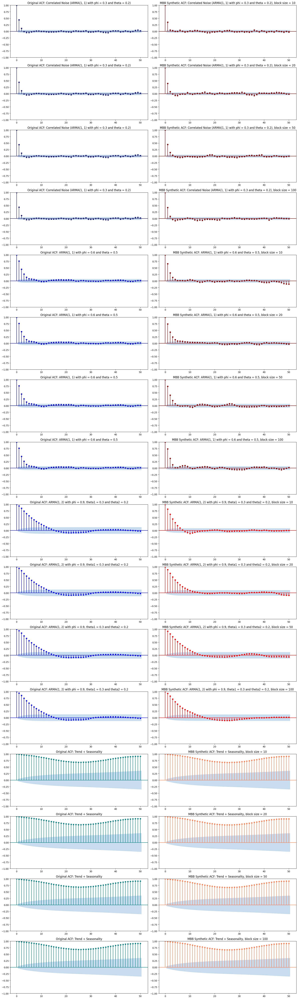

In [12]:
#Plotting the acf for original and the corresponding synthetic with 16 by 2 design
fig, axes = plt.subplots(16, 2, figsize = (18, 60))

plotIndex = 0

for i, name in enumerate(seriesNames):
  original = originalSeries[name]

  for blockSize in blockSizes:
    synthetic = MBBsyntheticExamples[blockSize][name]

    #Until lag 50
    plot_acf(original, ax = axes[plotIndex, 0], lags = 50, color = colorsOrig[i], vlines_kwargs={'colors': colorsOrig[i]})
    axes[plotIndex, 0].set_title(f'Original ACF: {name}')

    plot_acf(synthetic, ax = axes[plotIndex, 1], lags = 50, color = colorsSynth[i], vlines_kwargs={'colors': colorsSynth[i]})
    axes[plotIndex, 1].set_title(f'MBB Synthetic ACF: {name}, block size = {blockSize}')

    #Add 1 to plot index so that it can move on to the next block size / series
    plotIndex += 1

plt.tight_layout()
plt.show()

Monte Carlo Simulatoin for the analysis of methods

In [13]:
np.random.seed(0)

B = 500

noiseName = "Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)"

MBBsamplesAll = {}

for blockSize in blockSizes:
    MBBsamplesAll[blockSize] = {}

    # Generate samples for stationary series
    for name, series in stationarySeries.items():
        samples = []

        # 500 samples
        for b in range(B):
            sample = moving_block_bootstrap(series, blockSize)
            samples.append(sample)

        MBBsamplesAll[blockSize][name] = np.array(samples)

    # Use the same generated correlated noise samples to create the Trend + Seasonality series
    syntheticResidualSamples = MBBsamplesAll[blockSize][noiseName]
    syntheticTrendSeasonalSamples = syntheticResidualSamples + trend + seasonality

    MBBsamplesAll[blockSize]["Trend + Seasonality"] = syntheticTrendSeasonalSamples

#Checking the shape for each series
for blockSize in blockSizes:
    for name in seriesNames:
        print(blockSize, name, MBBsamplesAll[blockSize][name].shape)

10 Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2) (500, 2000)
10 ARMA(1, 1) with phi = 0.6 and theta = 0.5 (500, 2000)
10 ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2 (500, 2000)
10 Trend + Seasonality (500, 2000)
20 Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2) (500, 2000)
20 ARMA(1, 1) with phi = 0.6 and theta = 0.5 (500, 2000)
20 ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2 (500, 2000)
20 Trend + Seasonality (500, 2000)
50 Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2) (500, 2000)
50 ARMA(1, 1) with phi = 0.6 and theta = 0.5 (500, 2000)
50 ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2 (500, 2000)
50 Trend + Seasonality (500, 2000)
100 Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2) (500, 2000)
100 ARMA(1, 1) with phi = 0.6 and theta = 0.5 (500, 2000)
100 ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2 (500, 2000)
100 Trend + Seasonality (500, 2000)


In [14]:
#5 synthetic data to plot
numToPlot = 5

fig, axes = plt.subplots(16, 1, figsize = (25, 60))

plotIndex = 0

for i, name in enumerate(seriesNames):
  original = originalSeries[name]

  for blockSize in blockSizes:
    samples = MBBsamplesAll[blockSize][name]

    #Plotting 5 synthetic data in this loop over the same original time series data
    for k in range(numToPlot):
      axes[plotIndex].plot(samples[k], color = colorsSynth[i], alpha = 0.5, linewidth = 1, label = 'MBB Synthetic' if k == 0 else None)

    axes[plotIndex].plot(original, color = colorsOrig[i], linewidth = 2, label = "Original")
    axes[plotIndex].set_title(f'MBB synthetic time series with {name}, block size = {blockSize}')
    axes[plotIndex].set_xlabel('Time')
    axes[plotIndex].set_ylabel('Value')
    axes[plotIndex].legend(loc = 'upper right')

    #Add 1 to plot index so that it can move on to the next block size / series
    plotIndex += 1

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [15]:
#This function returns a numpy array of autocorrelation values.
def acf_values(series, maxLag = 50):
  return acf(series, nlags=maxLag)

#acf value function for many samples up to lag 50.
def compute_acf_for_samples(samples, maxLag = 50):
  acfs = []
  for sample in samples:
    acfs.append(acf_values(sample, maxLag))
  return np.array(acfs)

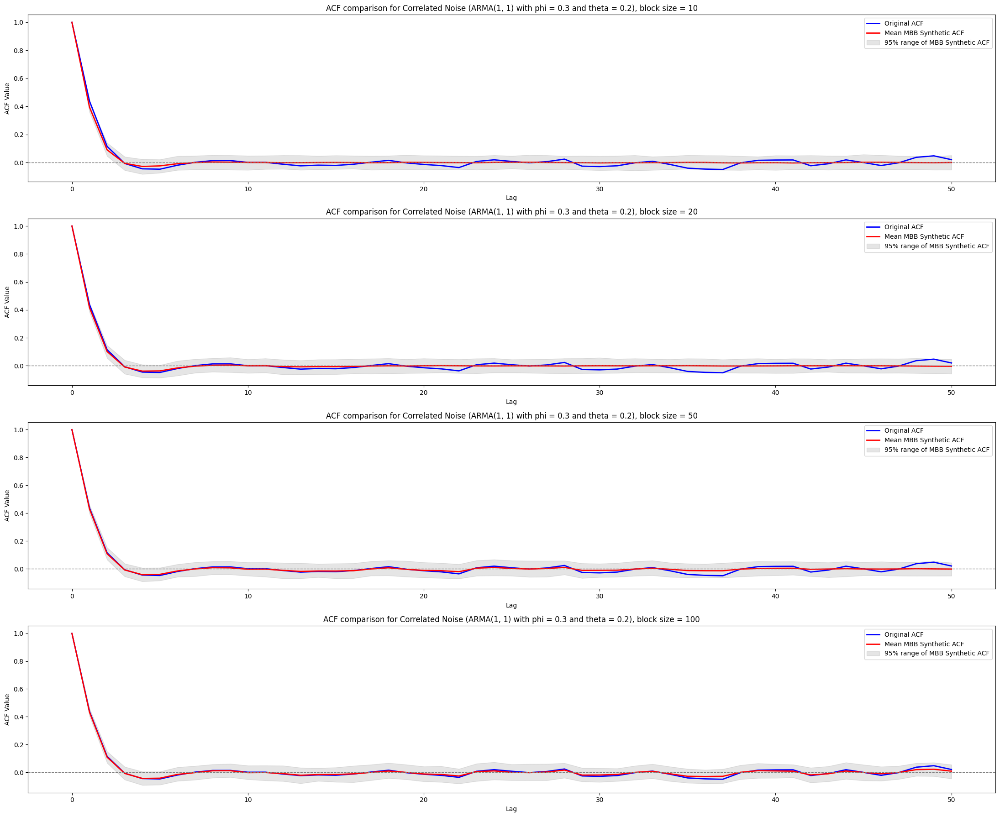

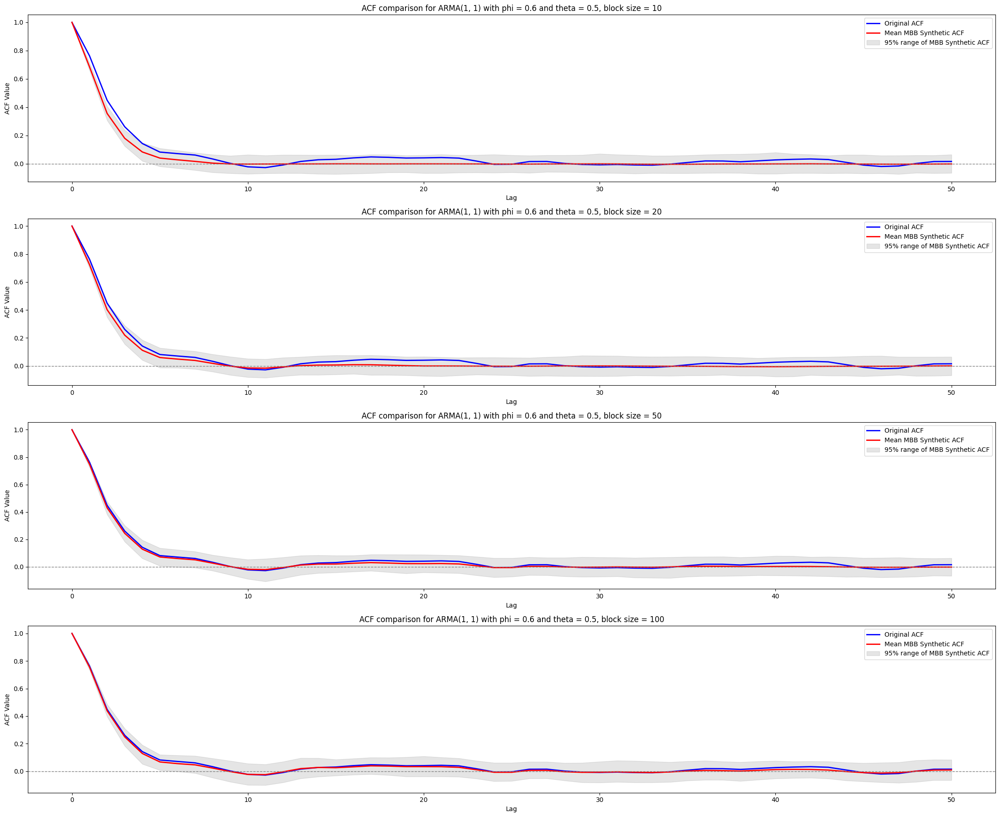

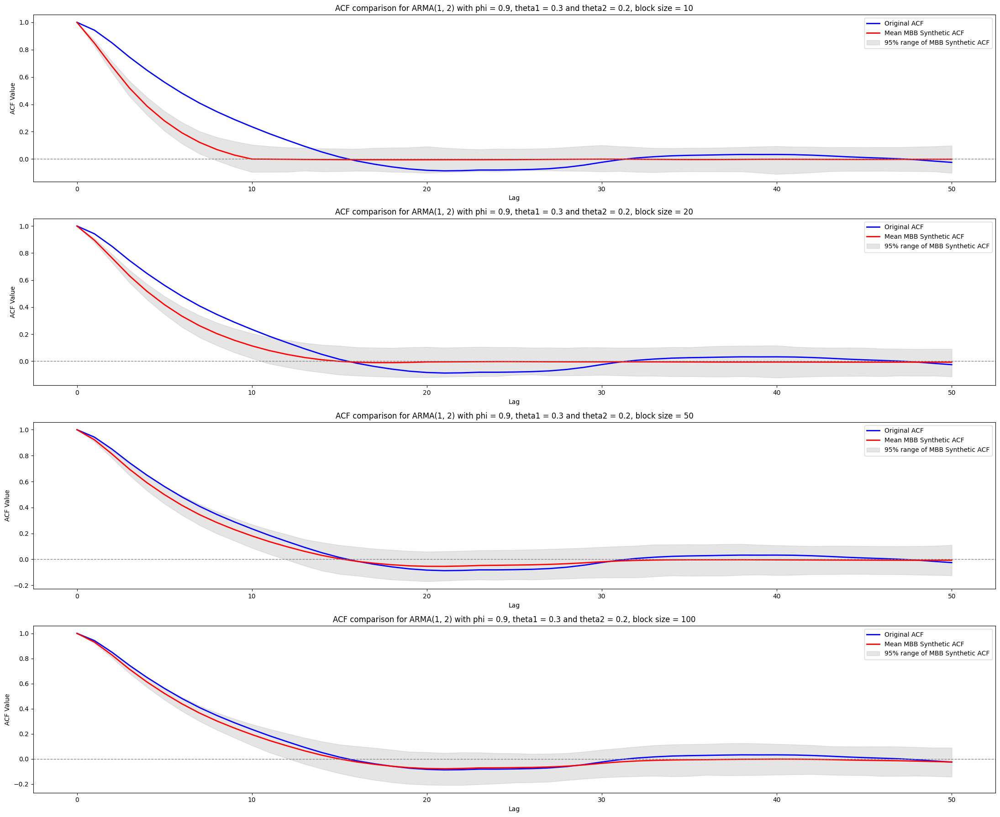

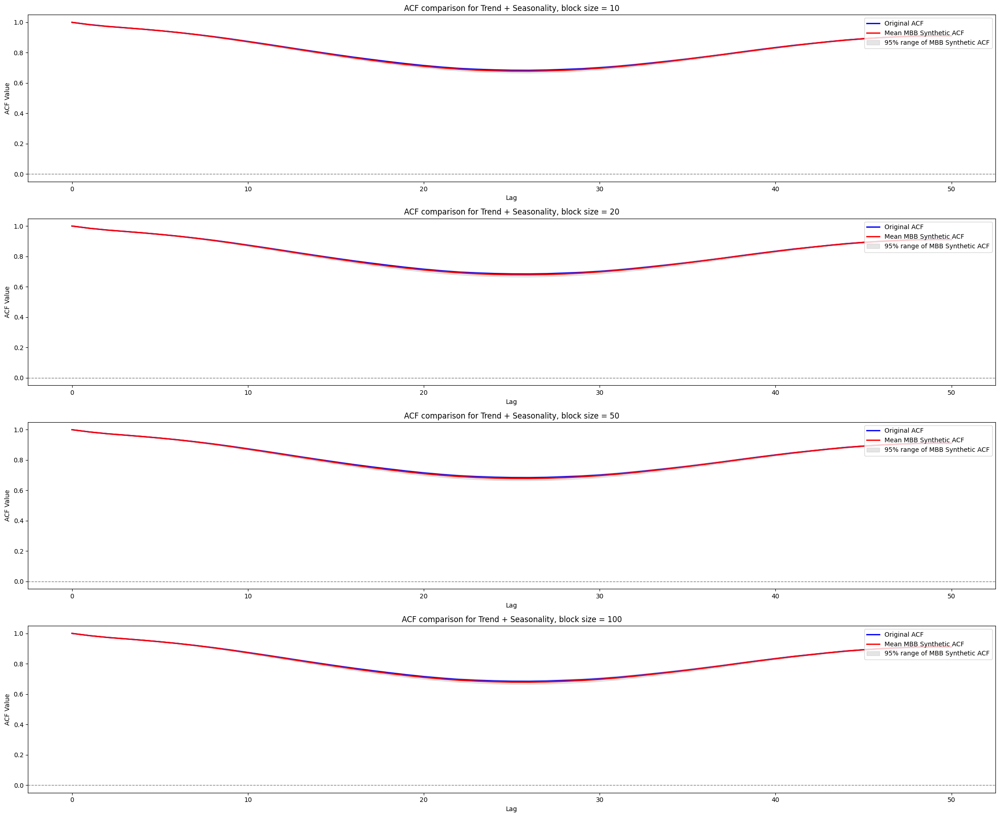

In [16]:
maxLag = 50
lags = np.arange(maxLag + 1)

#Comparing the acf of original and synthetic for each series and block
for i, name in enumerate(seriesNames):
  fig, axes = plt.subplots(4, 1, figsize = (22, 18))

  original = originalSeries[name]
  originalACF = acf_values(original, maxLag=maxLag)

  for j, blockSize in enumerate(blockSizes):
    samples = MBBsamplesAll[blockSize][name]
    samplesACF = compute_acf_for_samples(samples, maxLag = maxLag)

    meanACF = np.mean(samplesACF, axis = 0)
    #Percentile, not a critical value of confidence interval
    lowerACF = np.percentile(samplesACF, 2.5, axis = 0)
    upperACF = np.percentile(samplesACF, 97.5, axis = 0)

    axes[j].plot(lags, originalACF, color = 'blue', linewidth = 2, label = "Original ACF")
    axes[j].plot(lags, meanACF, color = 'red', linewidth = 2, label = "Mean MBB Synthetic ACF")
    #95% range
    axes[j].fill_between(lags, lowerACF, upperACF, color = 'gray', alpha = 0.2, label = '95% range of MBB Synthetic ACF')

    axes[j].axhline(0, color='gray', linestyle = '--', linewidth = 1)
    axes[j].set_title(f'ACF comparison for {name}, block size = {blockSize}')
    axes[j].set_xlabel('Lag')
    axes[j].set_ylabel('ACF Value')
    axes[j].legend(loc = 'upper right')

  plt.tight_layout()
  plt.show()

In [17]:
def acf_error(original, synthetic, maxLag = 50):
  #Computing the original and synthetic ACF values
  originalACF = acf_values(original, maxLag = maxLag)
  syntheticACF = acf_values(synthetic, maxLag = maxLag)

  #Excluding lag 0 since it is always 1
  return np.sum((originalACF[1:] - syntheticACF[1:])**2)

def mean_error(original, synthetic):
    #Difference between the mean of original and synthetic
    return abs(np.mean(original) - np.mean(synthetic))

def variance_error(original, synthetic):
    #Difference between the variance of original and synthetic
    return abs(np.var(original) - np.var(synthetic))

def monte_carlo_ci(values):
  values = np.array(values)

  #Statistic across Monte Carlo Samples
  meanValue = np.mean(values)
  #ddof = 1 is set to compute sample standard deviation
  stdValue = np.std(values, ddof = 1)
  seValue = stdValue / np.sqrt(len(values))

  lowerCI = meanValue - 1.96 * seValue
  upperCI = meanValue + 1.96 * seValue

  return round(meanValue, 4), [round(lowerCI, 4), round(upperCI, 4)]

In [18]:
rows = []

for blockSize in blockSizes:
    for name, original in originalSeries.items():
        samples = MBBsamplesAll[blockSize][name]

        meanErrors = []
        varianceErrors = []
        acfErrors = []

        for sample in samples:
            meanErrors.append(mean_error(original, sample))
            varianceErrors.append(variance_error(original, sample))
            acfErrors.append(acf_error(original, sample, maxLag = maxLag))

        meanACF, acfCI = monte_carlo_ci(acfErrors)
        meanMeanError, meanErrorCI = monte_carlo_ci(meanErrors)
        meanVarianceError, varianceErrorCI = monte_carlo_ci(varianceErrors)

        #Creating table of the result
        rows.append({
            "Method": "Moving Block Bootstrap",
            "Tuning": f"block size = {blockSize}",
            "Series": name,
            "mean_acf_error": meanACF,
            "acf_error_95ci": acfCI,

            "mean_error_mean": meanMeanError,
            "mean_error_95ci": meanErrorCI,

            "variance_error_mean": meanVarianceError,
            "variance_error_95ci": varianceErrorCI
        })

mbbSummary = pd.DataFrame(rows)

mbbSummary

,Method,Tuning,Series,mean_acf_error,acf_error_95ci,mean_error_mean,mean_error_95ci,variance_error_mean,variance_error_95ci
0,Moving Block Bootstrap,block size = 10,"Correlated Noise (ARMA(1, 1) with phi = 0.3 an...",0.0556,"[0.0544, 0.0568]",0.0129,"[0.012, 0.0138]",0.0082,"[0.0076, 0.0087]"
1,Moving Block Bootstrap,block size = 10,"ARMA(1, 1) with phi = 0.6 and theta = 0.5",0.1091,"[0.106, 0.1122]",0.0585,"[0.0545, 0.0624]",0.0978,"[0.091, 0.1047]"
2,Moving Block Bootstrap,block size = 10,"ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and th...",0.8426,"[0.8243, 0.8609]",0.1497,"[0.1401, 0.1592]",0.5875,"[0.5479, 0.6271]"
3,Moving Block Bootstrap,block size = 10,Trend + Seasonality,0.0012,"[0.0011, 0.0014]",0.0129,"[0.012, 0.0138]",0.1962,"[0.186, 0.2065]"
4,Moving Block Bootstrap,block size = 20,"Correlated Noise (ARMA(1, 1) with phi = 0.3 an...",0.0541,"[0.0529, 0.0553]",0.0134,"[0.0125, 0.0143]",0.0081,"[0.0075, 0.0086]"
5,Moving Block Bootstrap,block size = 20,"ARMA(1, 1) with phi = 0.6 and theta = 0.5",0.0876,"[0.0846, 0.0906]",0.0620,"[0.0581, 0.066]",0.1051,"[0.0983, 0.112]"
6,Moving Block Bootstrap,block size = 20,"ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and th...",0.3824,"[0.3696, 0.3951]",0.1817,"[0.1695, 0.194]",0.6342,"[0.5916, 0.6768]"
7,Moving Block Bootstrap,block size = 20,Trend + Seasonality,0.0013,"[0.0012, 0.0015]",0.0134,"[0.0125, 0.0143]",0.1958,"[0.1857, 0.2058]"
8,Moving Block Bootstrap,block size = 50,"Correlated Noise (ARMA(1, 1) with phi = 0.3 an...",0.0449,"[0.0438, 0.046]",0.0128,"[0.012, 0.0136]",0.0086,"[0.008, 0.0092]"
9,Moving Block Bootstrap,block size = 50,"ARMA(1, 1) with phi = 0.6 and theta = 0.5",0.0697,"[0.067, 0.0725]",0.0651,"[0.0608, 0.0694]",0.1011,"[0.0944, 0.1078]"


Different Method of synthetic data generation (Sieve Bootstrap)

In [19]:
def sieve_bootstrap(series, p, outputlength=None, burn_in=100):

    seriesLength = len(series)

    #Addressing edge cases
    if outputlength is None:
        outputlength = seriesLength

    if p <= 0:
        raise ValueError("The AR order p must be positive.")

    if p >= seriesLength:
        raise ValueError("The AR order p must be smaller than the length of the series.")

    #Fitting an AR(p) model to the original series
    model = AutoReg(series, lags=p, trend='c', old_names=False).fit()

    #Extracting parameters from [intercept, phi_1, phi_2, phi_3...]
    intercept = model.params[0]
    phi_hat = model.params[1:]

    residuals = model.resid
    #Centering around zero
    residuals = residuals - np.mean(residuals)

    #Burn-in is added to reduce the effect of initial values
    totalLength = outputlength + burn_in

    #Random sample of residuals
    bootResiduals = np.random.choice(residuals, size=totalLength, replace=True)

    synthetic = np.zeros(totalLength)
    synthetic[:p] = series[:p]

    for i in range(p, totalLength):
        #Getting the previous p values (not p-value) and reversing them to match coefficients (X(t-1),...X(t-p))
        pastValues = synthetic[i-p:i][::-1]
        synthetic[i] = intercept + np.dot(phi_hat, pastValues) + bootResiduals[i]

    #Removing the burn-in
    return synthetic[burn_in:]

In [20]:
def select_ar_order(series, maxP = 50, criterion = 'BIC'):
  #To store AIC and BIC values for each AR order
  results = []

  #Fitting AR models from p = 1 to maxP
  for p in range(1, maxP + 1):

    model = AutoReg(series, lags = p, trend = 'c', old_names = False).fit()

    results.append({
        'p': p,
        'AIC': model.aic,
        'BIC': model.bic
    })

  results = pd.DataFrame(results)

  #Selecting the AR order with the smallest AIC or BIC
  if criterion == 'AIC':
    selectedP = int(results.loc[results['AIC'].idxmin(), 'p'])
  elif criterion == 'BIC':
    selectedP = int(results.loc[results['BIC'].idxmin(), 'p'])
  else:
    raise ValueError('Criterion must be either AIC or BIC.')

  return selectedP, results

In [21]:
selectedOrdersAIC = {}
selectedOrdersBIC = {}
orderSelectionTables = {}

#Selecting AR orders for each stationary series
for name, series in stationarySeries.items():
  i, orderTable = select_ar_order(series, maxP = 50, criterion = 'BIC')

  #Creating a table of AIC and BIC values for AR orders from 1 to 50. idxmin() is the index value where it gets minimum value
  selectedPAIC = int(orderTable.loc[orderTable['AIC'].idxmin(), "p"])
  selectedPBIC = int(orderTable.loc[orderTable['BIC'].idxmin(), "p"])

  #Storing the selected orders and selection table
  selectedOrdersAIC[name] = selectedPAIC
  selectedOrdersBIC[name] = selectedPBIC
  orderSelectionTables[name] = orderTable

  print(name)
  print("AIC selected p:", selectedPAIC)
  print("BIC selected p:", selectedPBIC)
  print(orderTable)
  print()

Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
AIC selected p: 48
BIC selected p: 2
     p          AIC          BIC
0    1  2931.903021  2948.704228
1    2  2915.158899  2937.558507
2    3  2915.365257  2943.362264
3    4  2915.216927  2948.810330
4    5  2916.164475  2955.353270
5    6  2916.373505  2961.156689
6    7  2917.472958  2967.849525
7    8  2916.945251  2972.914195
8    9  2916.774701  2978.335016
9   10  2918.080947  2985.231626
10  11  2918.500414  2991.240448
11  12  2916.538403  2994.866784
12  13  2917.565771  3001.481490
13  14  2919.022988  3008.525034
14  15  2920.011627  3015.098988
15  16  2920.996389  3021.668054
16  17  2922.204812  3028.459769
17  18  2922.254542  3034.091777
18  19  2922.994872  3040.413370
19  20  2924.328228  3047.326975
20  21  2925.398168  3053.976148
21  22  2923.865456  3058.021653
22  23  2921.416214  3061.149609
23  24  2919.129857  3064.439434
24  25  2920.528321  3071.413060
25  26  2922.029839  3078.488721
26  27  292

In [22]:
print(selectedOrdersAIC)
print(selectedOrdersBIC)

{'Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)': 48, 'ARMA(1, 1) with phi = 0.6 and theta = 0.5': 50, 'ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2': 50}
{'Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)': 2, 'ARMA(1, 1) with phi = 0.6 and theta = 0.5': 5, 'ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2': 4}


In [23]:
np.random.seed(0)

#Storing the minimum order for AIC/BIC
orderChoices = {
    "AIC": selectedOrdersAIC,
    "BIC": selectedOrdersBIC
}

SIEVEsyntheticExamples = {}

for criterion, selectedOrders in orderChoices.items():

    SIEVEsyntheticExamples[criterion] = {}

    # Generate synthetic series for stationary series
    for name, series in stationarySeries.items():

        p = selectedOrders[name]

        synthetic = sieve_bootstrap(series, p=p)

        SIEVEsyntheticExamples[criterion][name] = synthetic

        print(criterion, name, "p =", p, "shape =", synthetic.shape)

    # Using the same synthetic correlated noise to add Trend + Seasonality
    syntheticResidual = SIEVEsyntheticExamples[criterion][noiseName]
    syntheticTrendSeasonal = trend + seasonality + syntheticResidual

    SIEVEsyntheticExamples[criterion]["Trend + Seasonality"] = syntheticTrendSeasonal

    print(criterion, "Trend + Seasonality", "p =", selectedOrders[noiseName],
        "shape =", syntheticTrendSeasonal.shape)

    print()

AIC Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2) p = 48 shape = (2000,)
AIC ARMA(1, 1) with phi = 0.6 and theta = 0.5 p = 50 shape = (2000,)
AIC ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2 p = 50 shape = (2000,)
AIC Trend + Seasonality p = 48 shape = (2000,)

BIC Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2) p = 2 shape = (2000,)
BIC ARMA(1, 1) with phi = 0.6 and theta = 0.5 p = 5 shape = (2000,)
BIC ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2 p = 4 shape = (2000,)
BIC Trend + Seasonality p = 2 shape = (2000,)



In [24]:
colorsSieve = ['darkgreen', 'forestgreen', 'limegreen', 'lime']

#Plot for each AIC/BIC
for criterion, selectedOrders in orderChoices.items():

  fig, axes = plt.subplots(4, 1, figsize = (25, 22))

  #Iterating through all series
  for i, name in enumerate(seriesNames):

    original = originalSeries[name]
    synthetic = SIEVEsyntheticExamples[criterion][name]

    if name == "Trend + Seasonality":
      p = selectedOrders[noiseName]
    else:
      p = selectedOrders[name]


    #Plot using p from each criterion and series
    axes[i].plot(original, color = colorsOrig[i], linewidth = 2, label = "Original")
    axes[i].plot(synthetic, color = colorsSieve[i], linewidth = 1.5, label = f"Sieve Bootstrap Synthetic ({criterion}, p = {p})")
    axes[i].set_title(f'Original vs Sieve Bootstrap Synthetic with {name}, {criterion} p = {p}')
    axes[i].set_xlabel('Time')
    axes[i].set_ylabel("Value")
    axes[i].legend(loc = 'upper right')

  plt.tight_layout()
  plt.show()

Output hidden; open in https://colab.research.google.com to view.

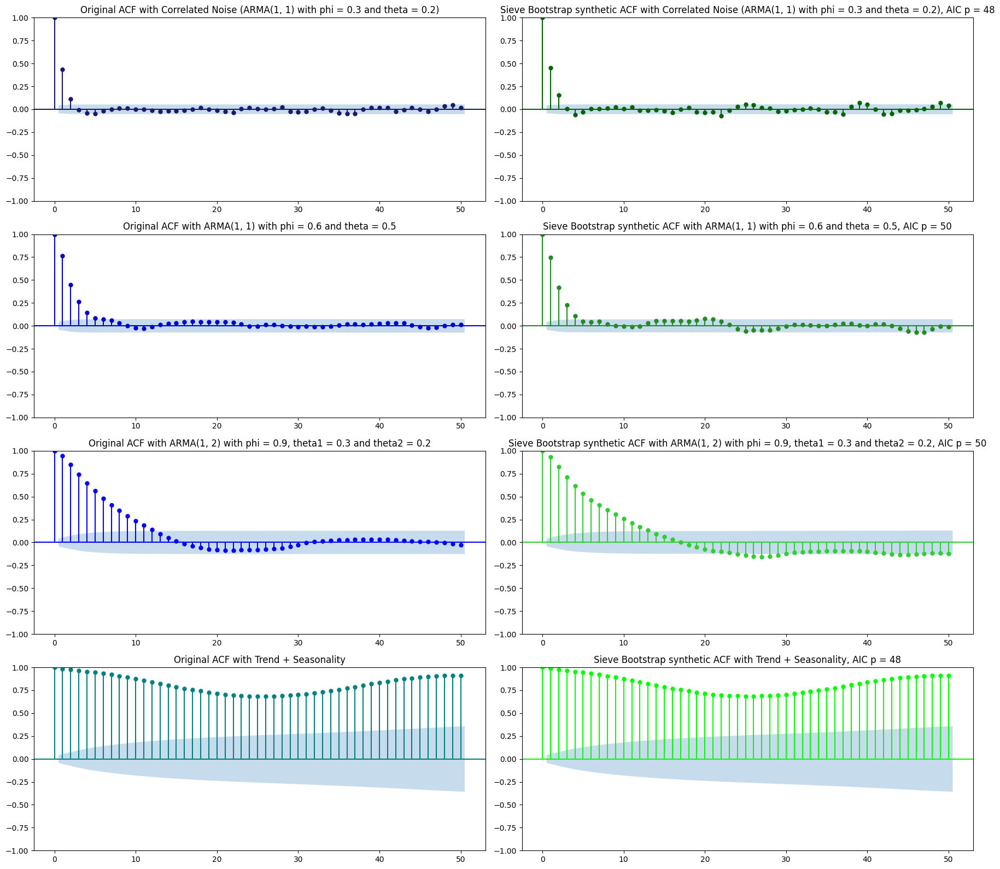

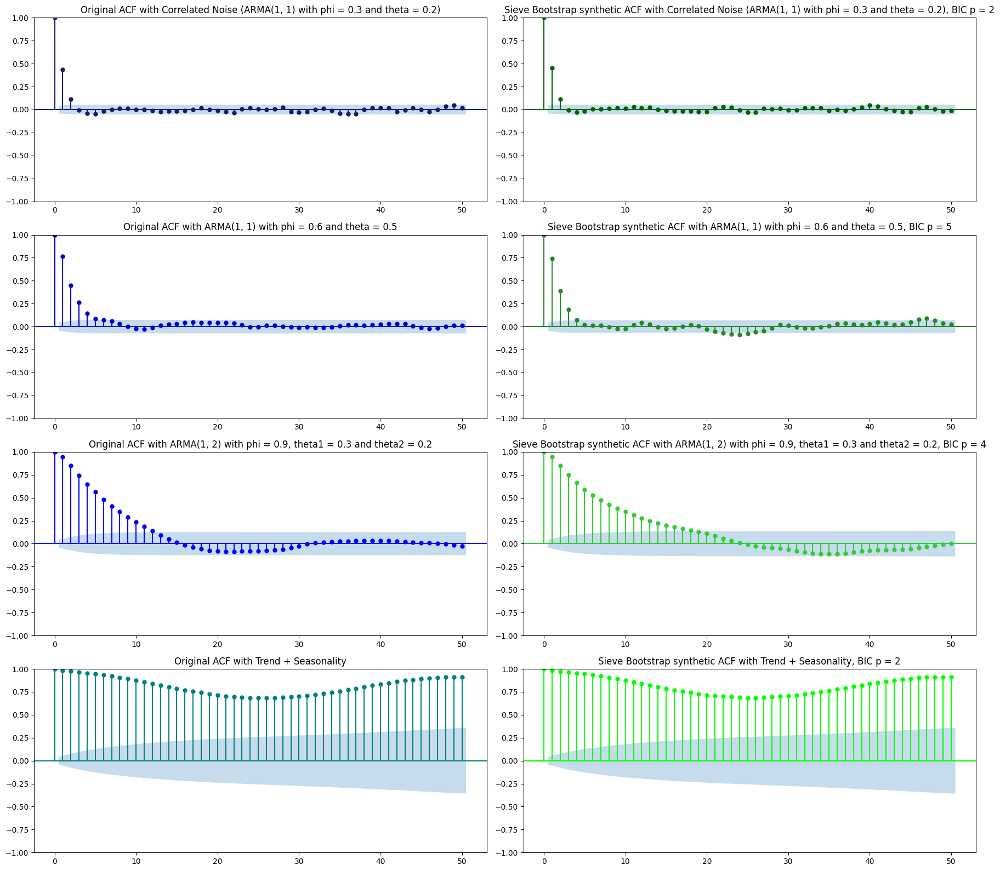

In [25]:
for criterion, selectedOrders in orderChoices.items():

  fig, axes = plt.subplots(4, 2, figsize = (18, 16))

  for i, name in enumerate(seriesNames):

    original = originalSeries[name]
    synthetic = SIEVEsyntheticExamples[criterion][name]

    if name == "Trend + Seasonality":
      p = selectedOrders[noiseName]
    else:
      p = selectedOrders[name]

    #ACF plot with original and synthetic
    plot_acf(original, ax = axes[i, 0], lags = 50, color = colorsOrig[i], vlines_kwargs = {'colors': colorsOrig[i]})
    axes[i, 0].set_title(f'Original ACF with {name}')

    plot_acf(synthetic, ax = axes[i, 1], lags = 50, color = colorsSieve[i], vlines_kwargs = {'colors': colorsSieve[i]})
    axes[i, 1].set_title(f'Sieve Bootstrap synthetic ACF with {name}, {criterion} p = {p}')

  plt.tight_layout()
  plt.show()

In [26]:
np.random.seed(0)

B = 500

SIEVEsamplesAll = {}

for criterion, selectedOrders in orderChoices.items():
  SIEVEsamplesAll[criterion] = {}

  #Generating samples for only stationary series
  for name, series in stationarySeries.items():

    samples = []
    p = selectedOrders[name]

    #Creating 500 samples
    for b in range(B):
      sample = sieve_bootstrap(series, p)
      samples.append(sample)

    SIEVEsamplesAll[criterion][name] = np.array(samples)

  # Use the same generated correlated noise samples to create the Trend + Seasonality series
  syntheticResidualSamples = SIEVEsamplesAll[criterion][noiseName]
  syntheticTrendSeasonalSamples = syntheticResidualSamples + trend + seasonality

  SIEVEsamplesAll[criterion]["Trend + Seasonality"] = syntheticTrendSeasonalSamples

for criterion, selectedOrders in orderChoices.items():
  print(criterion)

  for name in seriesNames:
    if name == "Trend + Seasonality":
      p = selectedOrders[noiseName]
    else:
      p = selectedOrders[name]

    #Checking the shape of synthetic data (500 samples and 2000 length)
    print(name, "p =", p, "shape =", SIEVEsamplesAll[criterion][name].shape)

  print()

AIC
Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2) p = 48 shape = (500, 2000)
ARMA(1, 1) with phi = 0.6 and theta = 0.5 p = 50 shape = (500, 2000)
ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2 p = 50 shape = (500, 2000)
Trend + Seasonality p = 48 shape = (500, 2000)

BIC
Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2) p = 2 shape = (500, 2000)
ARMA(1, 1) with phi = 0.6 and theta = 0.5 p = 5 shape = (500, 2000)
ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2 p = 4 shape = (500, 2000)
Trend + Seasonality p = 2 shape = (500, 2000)



In [27]:
#5 synthetic data to plot to display the overview of samples
numToPlot = 5

# Plot for each AIC/BIC
for criterion, selectedOrders in orderChoices.items():

    fig, axes = plt.subplots(4, 1, figsize=(25, 22))

    for i, name in enumerate(seriesNames):

        original = originalSeries[name]
        samples = SIEVEsamplesAll[criterion][name]

        if name == "Trend + Seasonality":
            p = selectedOrders[noiseName]
        else:
            p = selectedOrders[name]

        #Plotting 5 synthetic data in this loop over the same original time series data
        for k in range(numToPlot):
            axes[i].plot(samples[k], color = colorsSieve[i], alpha = 0.5, linewidth = 1, label="Sieve Bootstrap synthetic" if k == 0 else None)

        axes[i].plot(original, color = colorsOrig[i], linewidth = 2, label = "Original")

        axes[i].set_title(f"Sieve Bootstrap synthetic time series with {name}, {criterion} p = {p}")
        axes[i].set_xlabel("Time")
        axes[i].set_ylabel("Value")
        axes[i].legend(loc="upper right")

    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

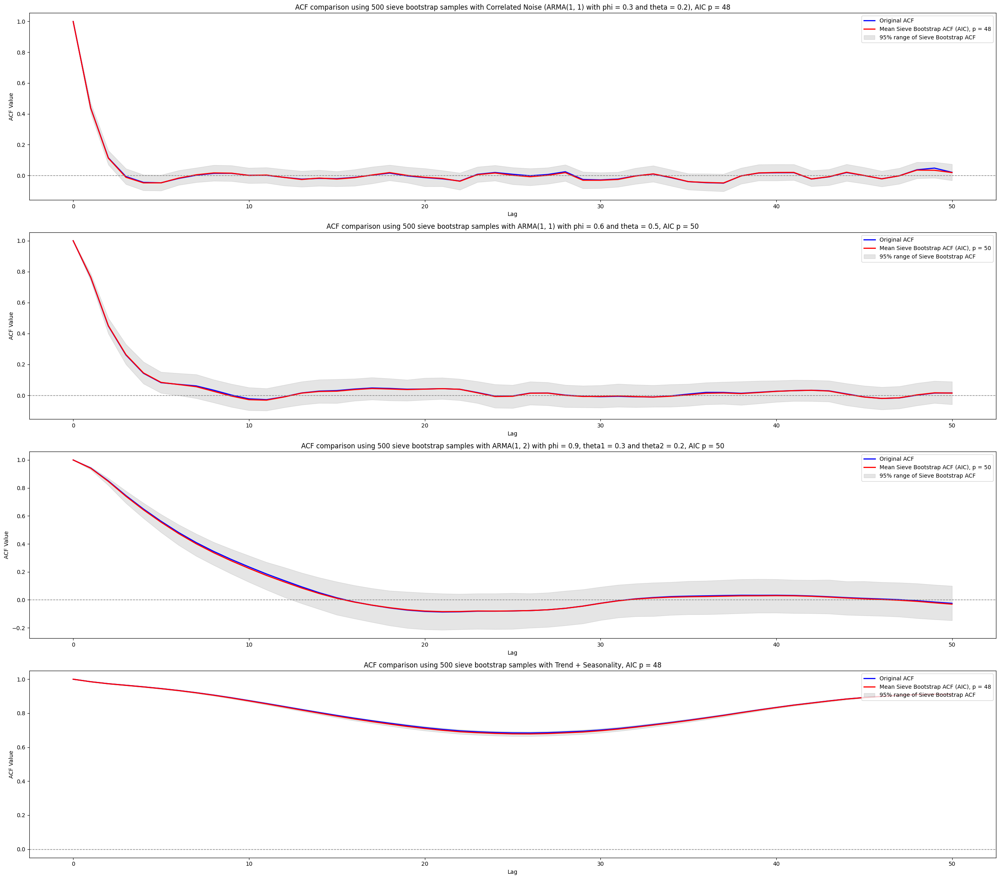

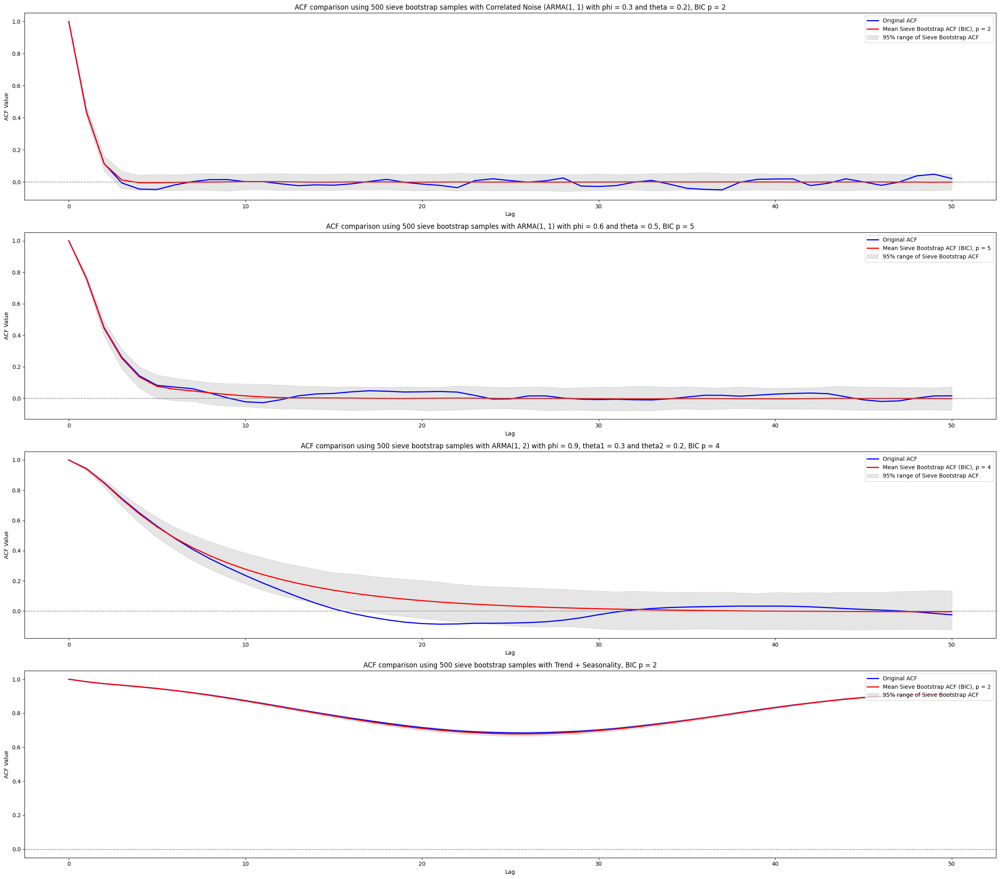

In [28]:
maxLag = 50
lags = np.arange(maxLag + 1)

for criterion, selectedOrders in orderChoices.items():

  fig, axes = plt.subplots(4, 1, figsize = (25, 22))

  #Comparing the acf of original and synthetic for each series and block
  for i, name in enumerate(seriesNames):

    original = originalSeries[name]
    samples = SIEVEsamplesAll[criterion][name]

    if name == "Trend + Seasonality":
      p = selectedOrders[noiseName]
    else:
      p = selectedOrders[name]

    originalACF = acf_values(original, maxLag = maxLag)
    samplesACF = compute_acf_for_samples(samples, maxLag = maxLag)

    #Percentile, not a critical value of confidence interval
    meanACF = np.mean(samplesACF, axis = 0)
    lowerACF = np.percentile(samplesACF, 2.5, axis = 0)
    upperACF = np.percentile(samplesACF, 97.5, axis = 0)

    axes[i].plot(lags, originalACF, color = 'blue', linewidth = 2, label = "Original ACF")
    axes[i].plot(lags, meanACF, color = 'red', linewidth = 2, label = f"Mean Sieve Bootstrap ACF ({criterion}), p = {p}")
    #95% range
    axes[i].fill_between(lags, lowerACF, upperACF, color = 'gray', alpha = 0.2, label = '95% range of Sieve Bootstrap ACF')

    axes[i].axhline(0, color = 'gray', linestyle = '--', linewidth = 1)
    axes[i].set_title(f'ACF comparison using 500 sieve bootstrap samples with {name}, {criterion} p = {p}')
    axes[i].set_xlabel('Lag')
    axes[i].set_ylabel('ACF Value')
    axes[i].legend(loc = 'upper right')

  plt.tight_layout()
  plt.show()

In [29]:
rows = []

#This time, the value of order chosen by AIC / BIC is also a factor to consider
for criterion, selectedOrders in orderChoices.items():

    for name, original in originalSeries.items():

        samples = SIEVEsamplesAll[criterion][name]

        if name == "Trend + Seasonality":
            p = selectedOrders[noiseName]
        else:
            p = selectedOrders[name]

        meanErrors = []
        varianceErrors = []
        acfErrors = []

        for sample in samples:
            meanErrors.append(mean_error(original, sample))
            varianceErrors.append(variance_error(original, sample))
            acfErrors.append(acf_error(original, sample, maxLag=maxLag))

        meanACF, acfCI = monte_carlo_ci(acfErrors)
        meanMeanError, meanErrorCI = monte_carlo_ci(meanErrors)
        meanVarianceError, varianceErrorCI = monte_carlo_ci(varianceErrors)

        #The table of results
        rows.append({
            "Method": "Sieve Bootstrap",
            "Tuning": f"p = {p} selected by {criterion}",
            "Series": name,

            "mean_acf_error": meanACF,
            "acf_error_95ci": acfCI,

            "mean_error_mean": meanMeanError,
            "mean_error_95ci": meanErrorCI,

            "variance_error_mean": meanVarianceError,
            "variance_error_95ci": varianceErrorCI
        })

SieveSummary = pd.DataFrame(rows)

SieveSummary

,Method,Tuning,Series,mean_acf_error,acf_error_95ci,mean_error_mean,mean_error_95ci,variance_error_mean,variance_error_95ci
0,Sieve Bootstrap,p = 48 selected by AIC,"Correlated Noise (ARMA(1, 1) with phi = 0.3 an...",0.0357,"[0.0347, 0.0366]",0.0127,"[0.0118, 0.0136]",0.0097,"[0.009, 0.0104]"
1,Sieve Bootstrap,p = 50 selected by AIC,"ARMA(1, 1) with phi = 0.6 and theta = 0.5",0.0669,"[0.0642, 0.0695]",0.0691,"[0.0645, 0.0738]",0.1064,"[0.0988, 0.1139]"
2,Sieve Bootstrap,p = 50 selected by AIC,"ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and th...",0.1657,"[0.1545, 0.1769]",0.1898,"[0.1769, 0.2026]",0.7792,"[0.7286, 0.8298]"
3,Sieve Bootstrap,p = 48 selected by AIC,Trend + Seasonality,0.0015,"[0.0013, 0.0016]",0.0127,"[0.0118, 0.0136]",0.1901,"[0.1805, 0.1998]"
4,Sieve Bootstrap,p = 2 selected by BIC,"Correlated Noise (ARMA(1, 1) with phi = 0.3 an...",0.0579,"[0.0566, 0.0592]",0.0158,"[0.0149, 0.0168]",0.0094,"[0.0088, 0.01]"
5,Sieve Bootstrap,p = 5 selected by BIC,"ARMA(1, 1) with phi = 0.6 and theta = 0.5",0.0916,"[0.0883, 0.095]",0.0648,"[0.0605, 0.0692]",0.1140,"[0.1067, 0.1213]"
6,Sieve Bootstrap,p = 4 selected by BIC,"ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and th...",0.4499,"[0.4225, 0.4772]",0.2347,"[0.2189, 0.2506]",0.7389,"[0.6909, 0.7869]"
7,Sieve Bootstrap,p = 2 selected by BIC,Trend + Seasonality,0.0014,"[0.0012, 0.0015]",0.0158,"[0.0149, 0.0168]",0.1919,"[0.1817, 0.2021]"


TimeGAN (Deep Learning Method) to generate the synthetic time series data

In [30]:
#importing libraries from timegan_utils.py
importlib.reload(timegan_utils)

from timegan_utils import (create_windows, train_timegan_for_series, generate_timegan_samples, timegan_diagnostics, mean_error, variance_error, acf_error)

In [31]:
timeganSeries = stationarySeries.copy()

In [32]:
def run_timegan_experiment(experimentName, seriesName, series, settings, outputlength, seed = 0):
  #Avoiding changing the original dictionary
  settings = settings.copy()

  seqLenCurrent = settings["seqLen"]
  scalerType = settings.pop("scalerType", "standard")

  #Using a function defined in timegan_utils.py. Scaling the series and creating windows
  windows, scaler = create_windows(series, seqLen=seqLenCurrent, scalerType=scalerType)

  #Storing the current windows and scaler in dictionaries
  TimeGANdataCurrent = {seriesName: windows}
  TimeGANscalersCurrent = {seriesName: scaler}

  models, losses, syntheticSeries = train_timegan_for_series(
      name=seriesName, TimeGANdata=TimeGANdataCurrent, TimeGANscalers=TimeGANscalersCurrent,
      outputlength=outputlength, seed=seed, **settings)

  result = {
      "experimentName": experimentName,
      "seriesName": seriesName,
      "settings": settings,
      "scalerType": scalerType,
      "windows": windows,
      "scaler": scaler,
      "models": models,
      "losses": losses,
      "syntheticSeries": syntheticSeries
    }

  return result

In [33]:
baseTimeGANSettings = {
    "seqLen": 50,
    "scalerType": "standard",
    "hiddenDim": 12,
    "numLayers": 1,
    "zDim": 5,
    "batchSize": 128,
    "pretrainIterations": 1000,
    "supervisorIterations": 1000,
    "jointIterations": 2000,
    "noiseType": "normal",
    "latentActivation": "tanh",
    "recoveryActivation": None,
    "supervisedWeight": 10,
    "momentWeight": 1,
    "gamma": 1
}

In [34]:
timeganResults = {}

#Training with baseline TimeGAN settings
for name, series in timeganSeries.items():
    print("=" * 100)
    print("Training main TimeGAN for", name)
    print("=" * 100)

    result = run_timegan_experiment(
        experimentName = "main",
        seriesName = name,
        series = series,
        settings = baseTimeGANSettings,
        outputlength = n,
        seed = 0
    )

    result["TimeGAN input"] = "Full stationary series"

    timeganResults[("main", name)] = result

Training main TimeGAN for Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
Embedder iteration 0, loss: 0.954924
Embedder iteration 100, loss: 0.035714
Embedder iteration 200, loss: 0.014491
Embedder iteration 300, loss: 0.006481
Embedder iteration 400, loss: 0.001973
Embedder iteration 500, loss: 0.001330
Embedder iteration 600, loss: 0.000806
Embedder iteration 700, loss: 0.000733
Embedder iteration 800, loss: 0.000717
Embedder iteration 900, loss: 0.000513
Supervisor iteration 0, loss: 0.409442
Supervisor iteration 100, loss: 0.125733
Supervisor iteration 200, loss: 0.054474
Supervisor iteration 300, loss: 0.038006
Supervisor iteration 400, loss: 0.034831
Supervisor iteration 500, loss: 0.033710
Supervisor iteration 600, loss: 0.032642
Supervisor iteration 700, loss: 0.032102
Supervisor iteration 800, loss: 0.033335
Supervisor iteration 900, loss: 0.031559
Joint iteration 0, G loss: 3.9032, E loss: 0.1922, D loss: 2.1604
Joint iteration 100, G loss: 4.5089, E loss: 0.1671

In [35]:
def add_trend_seasonality(timeganResults, experimentName):
  noiseResult = timeganResults[(experimentName, noiseName)]

  #Extracting the stationary part and adding trend and seasonality
  syntheticResidual = noiseResult["syntheticSeries"]
  syntheticTrendSeasonal = trend + seasonality + syntheticResidual

  trendSeasonalResult = noiseResult.copy()

  #Storing the important info and settings
  trendSeasonalResult["experimentName"] = experimentName
  trendSeasonalResult["seriesName"] = "Trend + Seasonality"
  trendSeasonalResult["syntheticSeries"] = syntheticTrendSeasonal
  trendSeasonalResult["TimeGAN input"] = "Correlated Noise"

  timeganResults[(experimentName, "Trend + Seasonality")] = trendSeasonalResult

In [36]:
add_trend_seasonality(timeganResults, "main")

In [37]:
for name in originalSeries.keys():
    result = timeganResults[("main", name)]

    print("=" * 80)
    print(name)
    print("TimeGAN input:", result["TimeGAN input"])
    print("=" * 80)

    #Checking the dependencies of synthetic time series
    timegan_diagnostics(originalSeries[name], result["syntheticSeries"], maxLag = maxLag)

    print()

Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
TimeGAN input: Full stationary series
Original mean: 0.0033619807048101383
Synthetic mean: -0.04186642

Original std: 0.5595905116906225
Synthetic std: 0.5257322

Original variance: 0.3131415407741727
Synthetic variance: 0.27639437

Original min/max: -1.8154763252593356 1.7167243990102408
Synthetic min/max: -1.0585015 1.404543

Original lag 1 ACF: 0.43754423038525864
Synthetic lag 1 ACF: 0.3837681817963546
ACF error: 0.052970463576106026

ARMA(1, 1) with phi = 0.6 and theta = 0.5
TimeGAN input: Full stationary series
Original mean: -0.0960526573552537
Synthetic mean: -0.049501054

Original std: 1.6213859514483049
Synthetic std: 1.5827777

Original variance: 2.628892403553925
Synthetic variance: 2.5051854

Original min/max: -5.444684357237385 5.406559833761003
Synthetic min/max: -3.8152146 4.1344266

Original lag 1 ACF: 0.7625689464939981
Synthetic lag 1 ACF: 0.6100409844424416
ACF error: 0.13697374119134598

ARMA(1, 2) with p

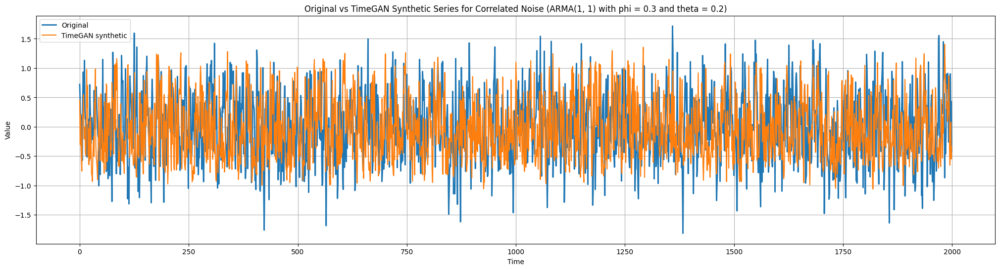

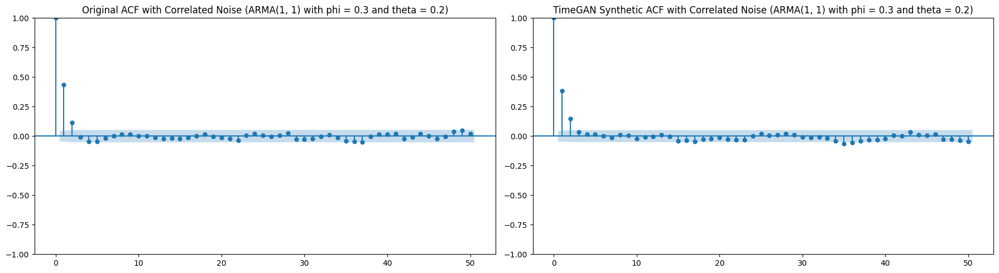

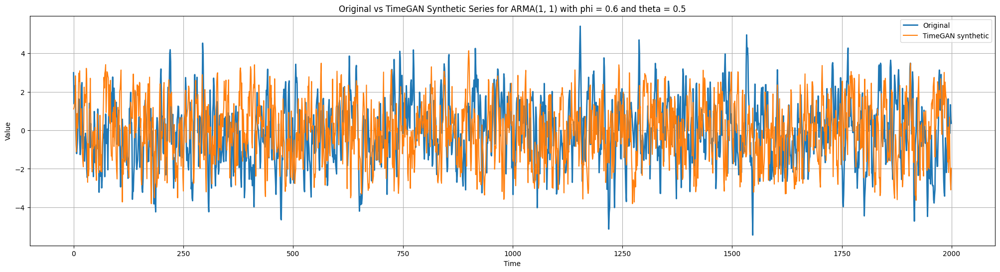

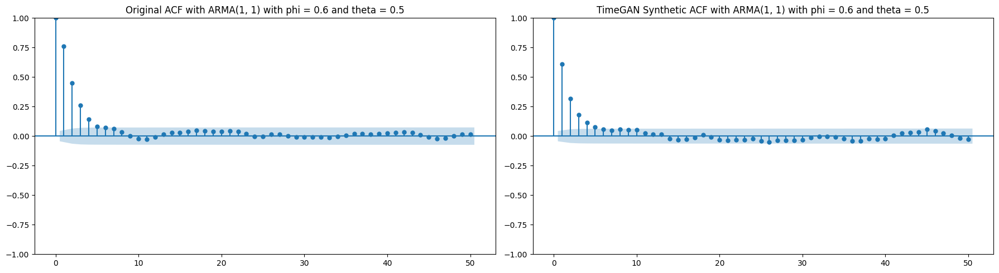

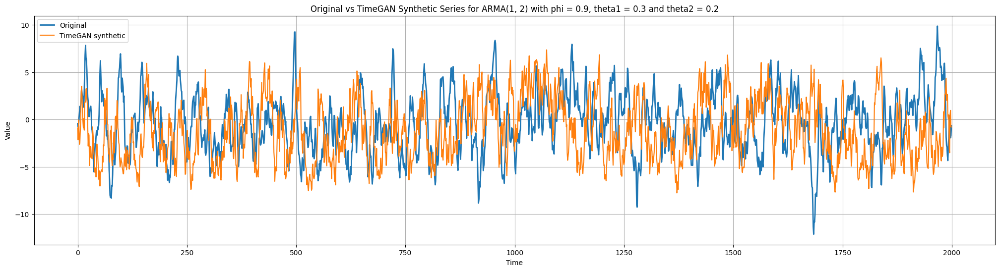

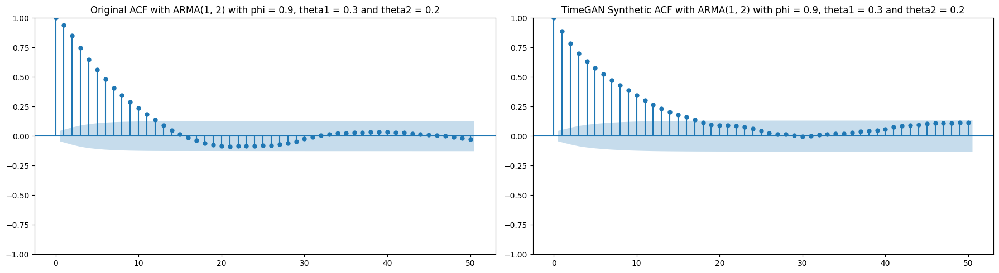

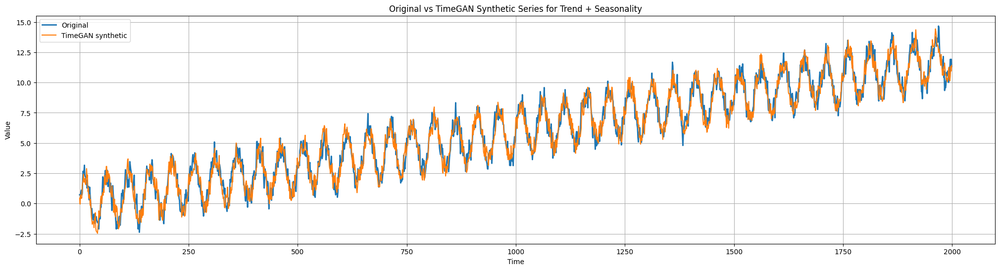

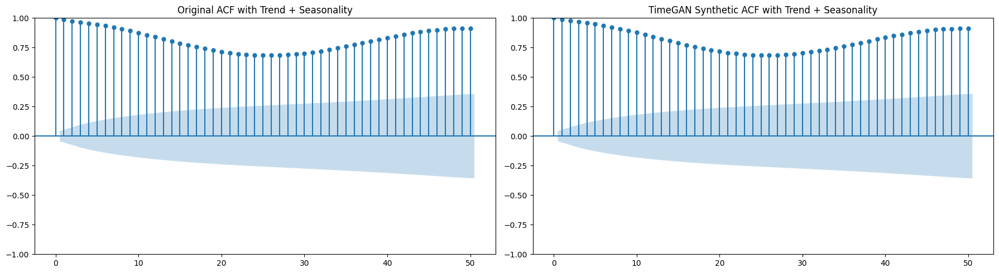

In [38]:
for name in originalSeries.keys():
    #Extracting one generated synthetic time series for each series
    result = timeganResults[("main", name)]
    syntheticSeries = result["syntheticSeries"]

    #Plotting the synthetic series over original one
    plt.figure(figsize = (25, 6))
    plt.plot(originalSeries[name], linewidth = 2, label="Original")
    plt.plot(syntheticSeries, linewidth = 1.5, label = "TimeGAN synthetic")

    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.title(f"Original vs TimeGAN Synthetic Series for {name}")
    plt.legend()
    plt.grid(True)
    plt.show()

    #ACF Plot
    fig, axes = plt.subplots(1, 2, figsize=(18, 5))

    plot_acf(originalSeries[name], ax=axes[0], lags=maxLag)
    axes[0].set_title(f"Original ACF with {name}")

    plot_acf(syntheticSeries, ax=axes[1], lags=maxLag)
    axes[1].set_title(f"TimeGAN Synthetic ACF with {name}")

    plt.tight_layout()
    plt.show()

In [39]:
def try_timegan_setting(seriesName, experimentName, updates = None, seed = 0):
  if updates is None:
    updates = {}

  settings = baseTimeGANSettings.copy()
  settings.update(updates)

  # If the target is Trend + Seasonality, train TimeGAN on the correlated noise
  if seriesName == "Trend + Seasonality":
      inputSeriesName = noiseName
  else:
      inputSeriesName = seriesName

  print("=" * 100)
  print(f"Training {experimentName} for {seriesName}")
  print("TimeGAN input series:", inputSeriesName)
  print(settings)
  print("=" * 100)

  result = run_timegan_experiment(
      experimentName = experimentName,
      seriesName = inputSeriesName,
      series = timeganSeries[inputSeriesName],
      settings = settings,
      outputlength = n,
      seed = seed
  )

  result["TimeGAN input"] = "Full stationary series"

  timeganResults[(experimentName, inputSeriesName)] = result

  # If TimeGAN was trained on correlated noise, also create Trend + Seasonality
  if inputSeriesName == noiseName:
      add_trend_seasonality(timeganResults, experimentName)

  # Choose which result to diagnose and plot
  if seriesName == "Trend + Seasonality":
      result = timeganResults[(experimentName, "Trend + Seasonality")]
  else:
      result = timeganResults[(experimentName, seriesName)]

  print()
  print("TimeGAN input:", result["TimeGAN input"])

  timegan_diagnostics(
      originalSeries[seriesName],
      result["syntheticSeries"],
      maxLag = maxLag
  )

  syntheticSeries = result["syntheticSeries"]

  #Plotting a synthetic series over the original series
  plt.figure(figsize = (25, 6))
  plt.plot(originalSeries[seriesName], linewidth = 2, label = "Original")
  plt.plot(syntheticSeries, linewidth = 1.5, label = "TimeGAN synthetic")
  plt.xlabel('Time')
  plt.ylabel('Value')
  plt.title(f"{experimentName}: Original vs TimeGAN Synthetic Series for {seriesName}")
  plt.legend()
  plt.grid(True)
  plt.show()

  #Plotting ACF
  fig, axes = plt.subplots(1, 2, figsize=(18, 5))

  plot_acf(originalSeries[seriesName], ax=axes[0], lags=maxLag)
  axes[0].set_title(f"Original ACF with {seriesName}")

  plot_acf(syntheticSeries, ax=axes[1], lags=maxLag)
  axes[1].set_title(f"{experimentName} TimeGAN ACF with {seriesName}")

  plt.tight_layout()
  plt.show()

  return None

In [40]:
def show_timegan_result(experimentName, seriesName):

  # Extracting the saved TimeGAN result
  result = timeganResults[(experimentName, seriesName)]
  syntheticSeries = result["syntheticSeries"]

  print("=" * 80)
  print(seriesName)
  print("TimeGAN input:", result["TimeGAN input"])
  print("=" * 80)

  timegan_diagnostics(
      originalSeries[seriesName],
      syntheticSeries,
      maxLag = maxLag
  )

  # Plotting the synthetic series over the original one
  plt.figure(figsize = (25, 6))
  plt.plot(originalSeries[seriesName], linewidth = 2, label = "Original")
  plt.plot(syntheticSeries, linewidth = 1.5, label = "TimeGAN synthetic")
  plt.xlabel("Time")
  plt.ylabel("Value")
  plt.title(f"{experimentName}: Original vs TimeGAN Synthetic Series for {seriesName}")
  plt.legend()
  plt.grid(True)
  plt.show()

  # Plotting the ACF of original and synthetic series
  fig, axes = plt.subplots(1, 2, figsize = (18, 5))

  plot_acf(originalSeries[seriesName], ax = axes[0], lags = maxLag)
  axes[0].set_title(f"Original ACF with {seriesName}")

  plot_acf(syntheticSeries, ax = axes[1], lags = maxLag)
  axes[1].set_title(f"{experimentName} TimeGAN ACF with {seriesName}")

  plt.tight_layout()
  plt.show()

  return None

Hyperparameter Tuning, only settings which recoreded relatively low mean ACF values are left in this notebook

Training seq100 for ARMA(1, 1) with phi = 0.6 and theta = 0.5
TimeGAN input series: ARMA(1, 1) with phi = 0.6 and theta = 0.5
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 1, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 10, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 1.010797
Embedder iteration 100, loss: 0.059423
Embedder iteration 200, loss: 0.007779
Embedder iteration 300, loss: 0.002821
Embedder iteration 400, loss: 0.001597
Embedder iteration 500, loss: 0.001501
Embedder iteration 600, loss: 0.000881
Embedder iteration 700, loss: 0.000978
Embedder iteration 800, loss: 0.000557
Embedder iteration 900, loss: 0.000473
Supervisor iteration 0, loss: 0.390688
Supervisor iteration 100, loss: 0.128171
Supervisor iteration 200, loss: 0.040625
Supervisor iteration 300, loss: 0.022915
Sup

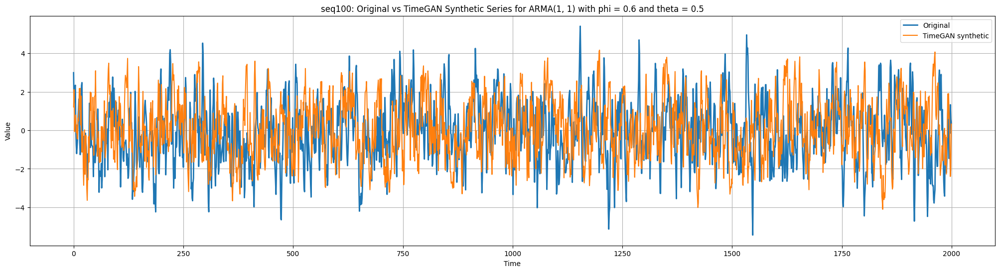

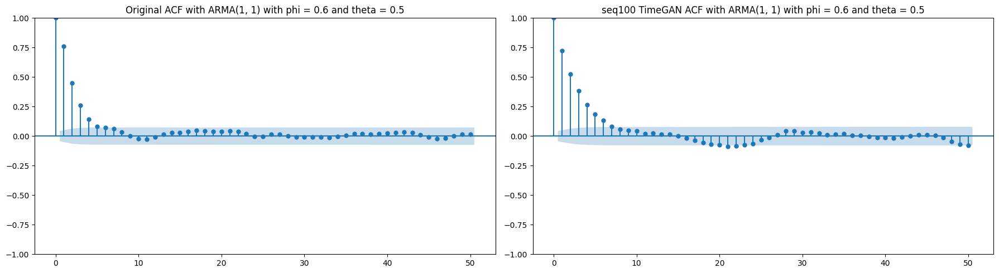

In [41]:
try_timegan_setting(
    seriesName = 'ARMA(1, 1) with phi = 0.6 and theta = 0.5',
    experimentName = 'seq100',
    updates = {
        "seqLen": 100
    }
)

Training seq100 for ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2
TimeGAN input series: ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 1, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 10, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 0.794893
Embedder iteration 100, loss: 0.039660
Embedder iteration 200, loss: 0.007746
Embedder iteration 300, loss: 0.003283
Embedder iteration 400, loss: 0.001688
Embedder iteration 500, loss: 0.001336
Embedder iteration 600, loss: 0.000831
Embedder iteration 700, loss: 0.000929
Embedder iteration 800, loss: 0.001269
Embedder iteration 900, loss: 0.000427
Supervisor iteration 0, loss: 0.305918
Supervisor iteration 100, loss: 0.096513
Supervisor iteration 200, loss: 0.032541
Supervisor ite

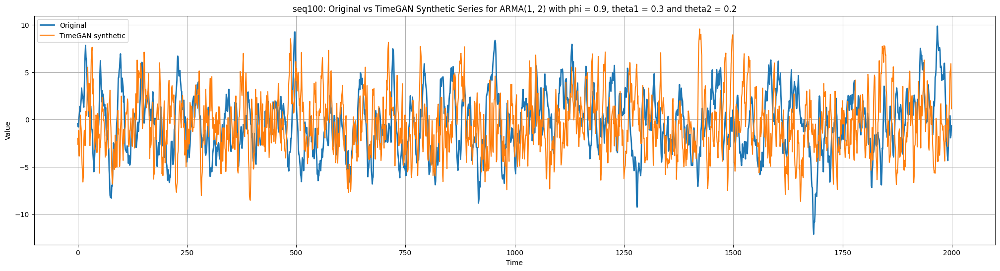

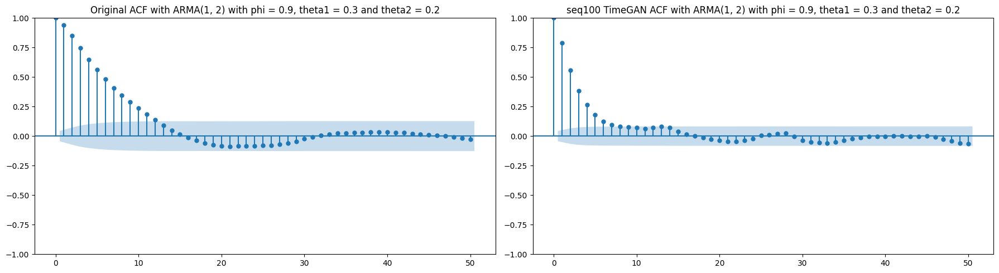

In [42]:
try_timegan_setting(
    seriesName = 'ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2',
    experimentName = 'seq100',
    updates = {
        "seqLen": 100
    }
)

Training seq100_sw5 for ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2
TimeGAN input series: ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 1, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 5, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 1.322359
Embedder iteration 100, loss: 0.115224
Embedder iteration 200, loss: 0.021585
Embedder iteration 300, loss: 0.008708
Embedder iteration 400, loss: 0.004034
Embedder iteration 500, loss: 0.002725
Embedder iteration 600, loss: 0.002006
Embedder iteration 700, loss: 0.002085
Embedder iteration 800, loss: 0.002175
Embedder iteration 900, loss: 0.000840
Supervisor iteration 0, loss: 0.301019
Supervisor iteration 100, loss: 0.061164
Supervisor iteration 200, loss: 0.020085
Supervisor 

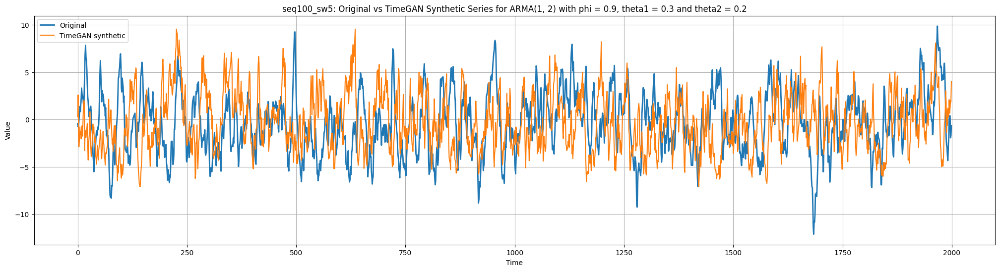

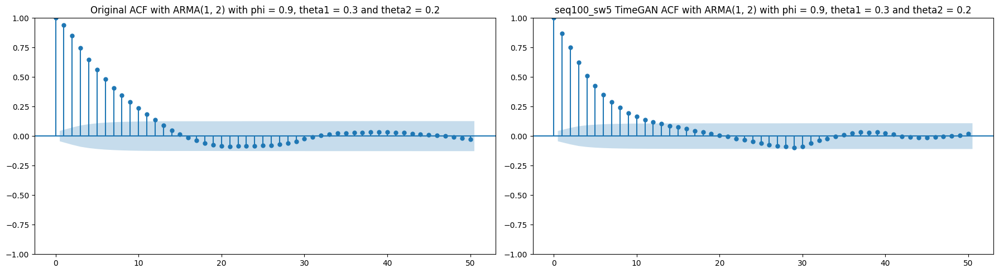

In [43]:
try_timegan_setting(
    seriesName = 'ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2',
    experimentName = 'seq100_sw5',
    updates = {
        'seqLen': 100,
        'supervisedWeight': 5
    }
)

Training seq100_hD8 for ARMA(1, 1) with phi = 0.6 and theta = 0.5
TimeGAN input series: ARMA(1, 1) with phi = 0.6 and theta = 0.5
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 8, 'numLayers': 1, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 10, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 1.009358
Embedder iteration 100, loss: 0.248014
Embedder iteration 200, loss: 0.026791
Embedder iteration 300, loss: 0.011070
Embedder iteration 400, loss: 0.006244
Embedder iteration 500, loss: 0.004535
Embedder iteration 600, loss: 0.002742
Embedder iteration 700, loss: 0.002411
Embedder iteration 800, loss: 0.001442
Embedder iteration 900, loss: 0.001316
Supervisor iteration 0, loss: 0.700818
Supervisor iteration 100, loss: 0.252507
Supervisor iteration 200, loss: 0.094824
Supervisor iteration 300, loss: 0.052851


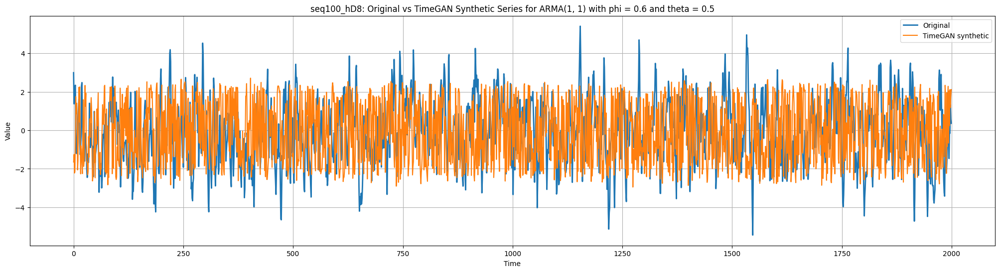

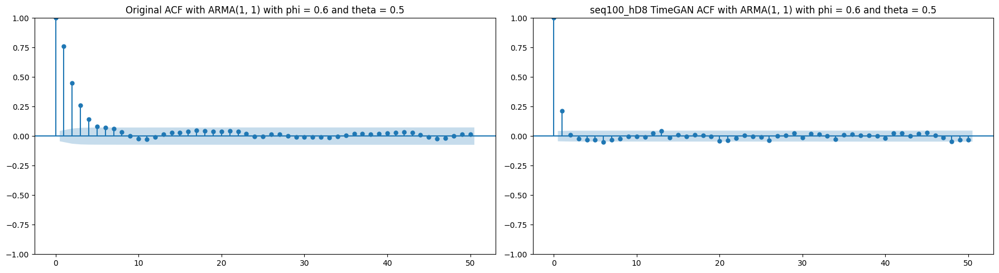

In [44]:
try_timegan_setting(
    seriesName = 'ARMA(1, 1) with phi = 0.6 and theta = 0.5',
    experimentName = 'seq100_hD8',
    updates = {
        'seqLen': 100,
        'hiddenDim': 8
    }
)

Training seq100_nL2_hD8 for Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
TimeGAN input series: Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 8, 'numLayers': 2, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 10, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 0.987444
Embedder iteration 100, loss: 0.080570
Embedder iteration 200, loss: 0.018862
Embedder iteration 300, loss: 0.006210
Embedder iteration 400, loss: 0.003433
Embedder iteration 500, loss: 0.002018
Embedder iteration 600, loss: 0.001518
Embedder iteration 700, loss: 0.000914
Embedder iteration 800, loss: 0.000944
Embedder iteration 900, loss: 0.000615
Supervisor iteration 0, loss: 0.637964
Supervisor iteration 100, loss: 0.050077
Supervisor iteration 200, loss: 0.023443

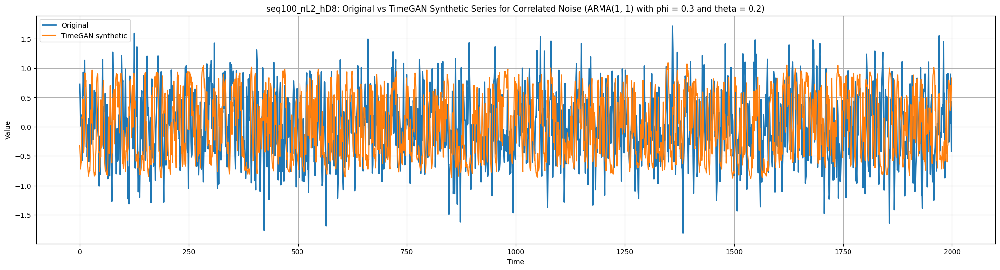

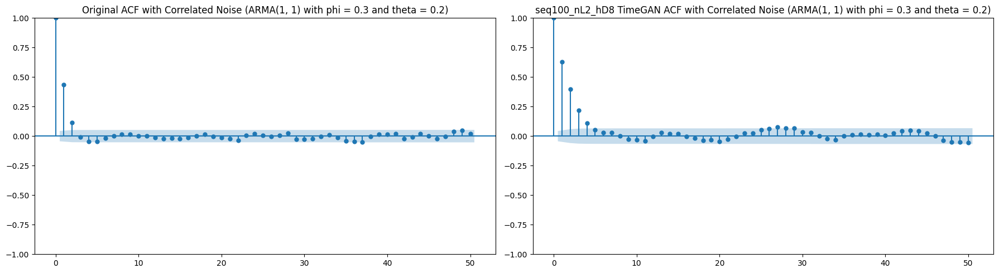

In [45]:
try_timegan_setting(
    seriesName = 'Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)',
    experimentName = 'seq100_nL2_hD8',
    updates = {
        'seqLen': 100,
        'numLayers': 2,
        'hiddenDim': 8
    }
)

Training seq100_nL2_hD8 for ARMA(1, 1) with phi = 0.6 and theta = 0.5
TimeGAN input series: ARMA(1, 1) with phi = 0.6 and theta = 0.5
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 8, 'numLayers': 2, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 10, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 0.882877
Embedder iteration 100, loss: 0.060900
Embedder iteration 200, loss: 0.011409
Embedder iteration 300, loss: 0.004600
Embedder iteration 400, loss: 0.002853
Embedder iteration 500, loss: 0.002612
Embedder iteration 600, loss: 0.001533
Embedder iteration 700, loss: 0.001756
Embedder iteration 800, loss: 0.000963
Embedder iteration 900, loss: 0.000860
Supervisor iteration 0, loss: 0.646297
Supervisor iteration 100, loss: 0.072667
Supervisor iteration 200, loss: 0.029931
Supervisor iteration 300, loss: 0.025

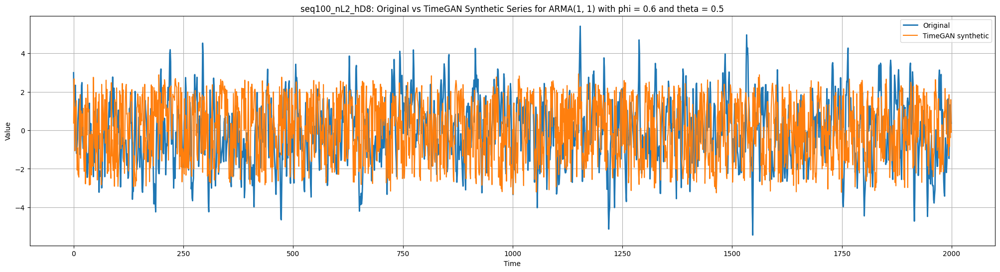

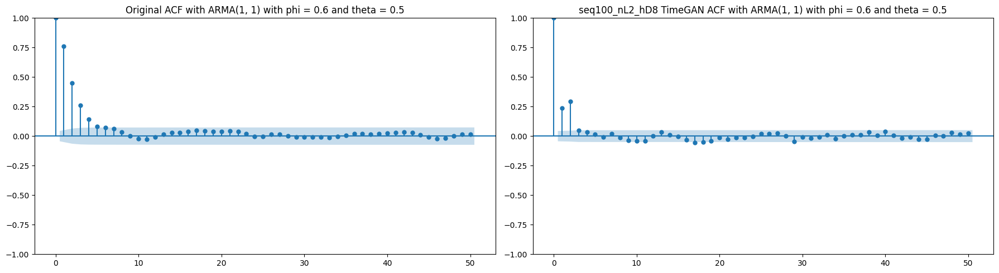

In [46]:
try_timegan_setting(
    seriesName = 'ARMA(1, 1) with phi = 0.6 and theta = 0.5',
    experimentName = 'seq100_nL2_hD8',
    updates = {
        'seqLen': 100,
        'numLayers': 2,
        'hiddenDim': 8
    }
)

Training seq100_nL2_hD16_sw5 for Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
TimeGAN input series: Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 16, 'numLayers': 2, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 5, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 1.022935
Embedder iteration 100, loss: 0.023462
Embedder iteration 200, loss: 0.004159
Embedder iteration 300, loss: 0.001596
Embedder iteration 400, loss: 0.001320
Embedder iteration 500, loss: 0.000736
Embedder iteration 600, loss: 0.000649
Embedder iteration 700, loss: 0.000255
Embedder iteration 800, loss: 0.000303
Embedder iteration 900, loss: 0.000248
Supervisor iteration 0, loss: 0.515512
Supervisor iteration 100, loss: 0.032075
Supervisor iteration 200, loss: 0.0

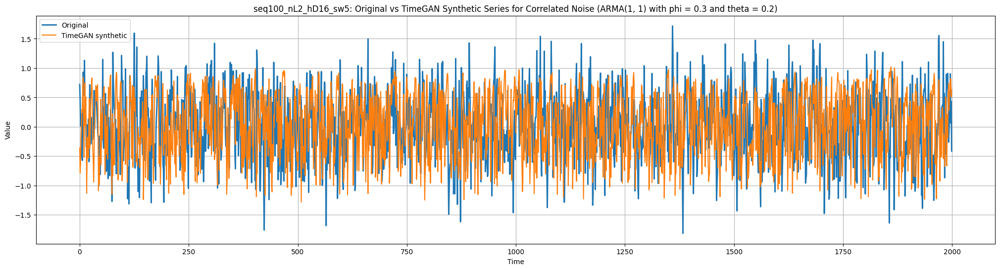

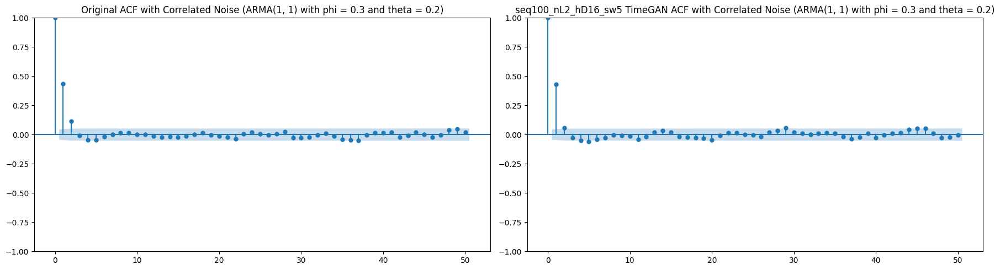

In [47]:
try_timegan_setting(
    seriesName = 'Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)',
    experimentName = 'seq100_nL2_hD16_sw5',
    updates = {
        'seqLen': 100,
        'numLayers': 2,
        'hiddenDim': 16,
        'supervisedWeight': 5
    }
)

Trend + Seasonality
TimeGAN input: Correlated Noise
Original mean: 6.00036198070481
Synthetic mean: 6.036435485800473

Original std: 3.73392019487072
Synthetic std: 3.774363481871657

Original variance: 13.942160021663396
Synthetic variance: 14.245819693286338

Original min/max: -2.380971732399037 14.66870745102812
Synthetic min/max: -2.374696728302771 14.476629535420612

Original lag 1 ACF: 0.9852918376593801
Synthetic lag 1 ACF: 0.9851463557010105
ACF error: 0.001559401124733367


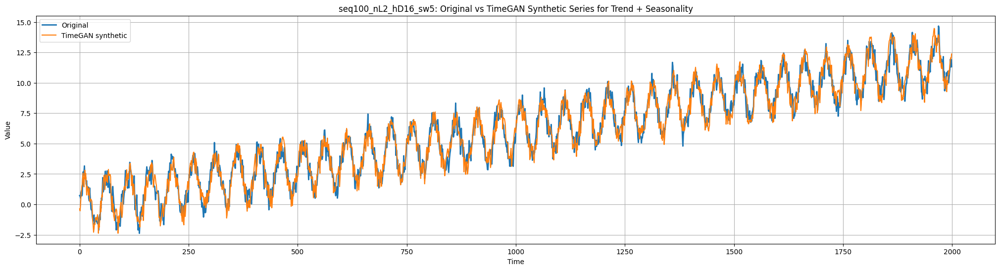

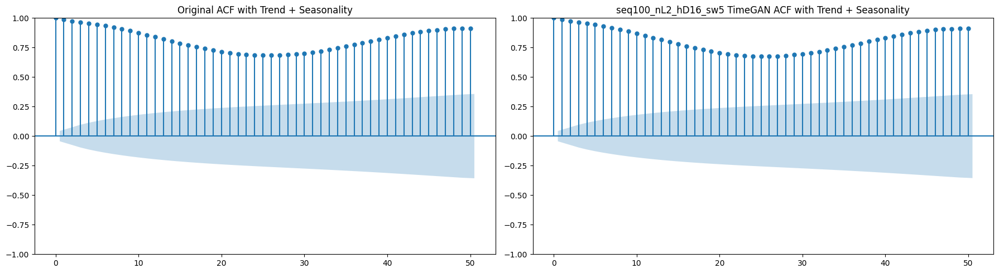

In [48]:
show_timegan_result(
    experimentName = 'seq100_nL2_hD16_sw5',
    seriesName = 'Trend + Seasonality'
)

Training seq100_nL2_hD16_sw15 for Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
TimeGAN input series: Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 16, 'numLayers': 2, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 15, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 1.010523
Embedder iteration 100, loss: 0.014750
Embedder iteration 200, loss: 0.003762
Embedder iteration 300, loss: 0.001684
Embedder iteration 400, loss: 0.001371
Embedder iteration 500, loss: 0.000865
Embedder iteration 600, loss: 0.000667
Embedder iteration 700, loss: 0.000354
Embedder iteration 800, loss: 0.000347
Embedder iteration 900, loss: 0.000231
Supervisor iteration 0, loss: 0.290873
Supervisor iteration 100, loss: 0.025900
Supervisor iteration 200, loss: 0

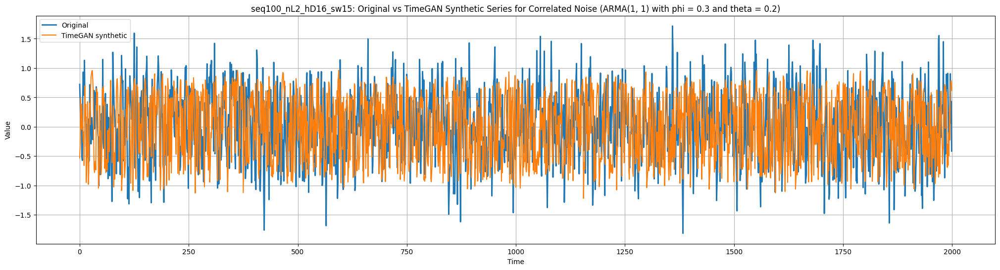

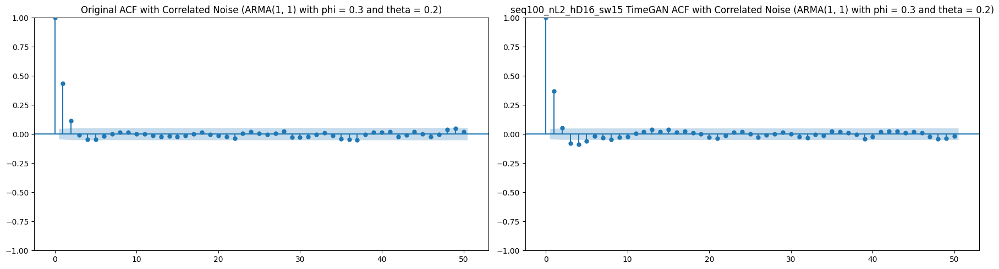

In [49]:
try_timegan_setting(
    seriesName = 'Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)',
    experimentName = 'seq100_nL2_hD16_sw15',
    updates = {
        'seqLen': 100,
        'numLayers': 2,
        'hiddenDim': 16,
        'supervisedWeight': 15
    }
)

Trend + Seasonality
TimeGAN input: Correlated Noise
Original mean: 6.00036198070481
Synthetic mean: 5.986183538819358

Original std: 3.73392019487072
Synthetic std: 3.749261578083049

Original variance: 13.942160021663396
Synthetic variance: 14.056962380889795

Original min/max: -2.380971732399037 14.66870745102812
Synthetic min/max: -2.508220138623053 14.319746842633647

Original lag 1 ACF: 0.9852918376593801
Synthetic lag 1 ACF: 0.9834595312629766
ACF error: 0.002710618749390467


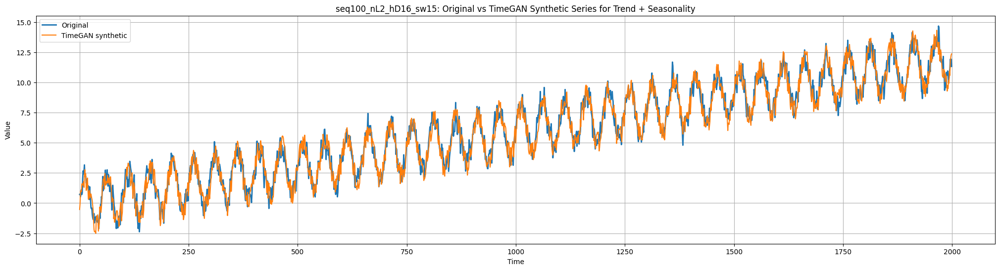

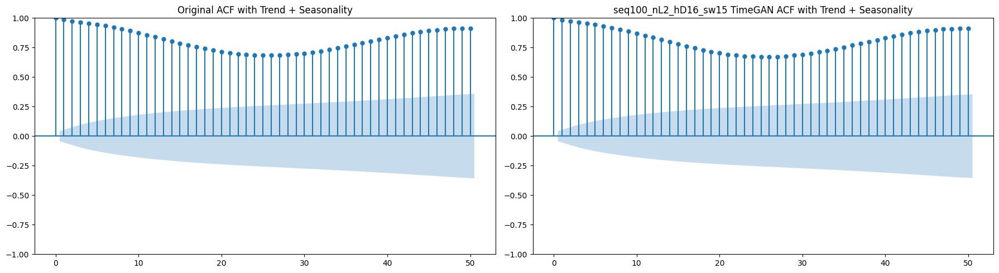

In [50]:
show_timegan_result(
    experimentName = 'seq100_nL2_hD16_sw15',
    seriesName = 'Trend + Seasonality'
)

Training seq100_nL2_hD8_sw15 for ARMA(1, 1) with phi = 0.6 and theta = 0.5
TimeGAN input series: ARMA(1, 1) with phi = 0.6 and theta = 0.5
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 8, 'numLayers': 2, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 15, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 0.993466
Embedder iteration 100, loss: 0.204665
Embedder iteration 200, loss: 0.011287
Embedder iteration 300, loss: 0.003539
Embedder iteration 400, loss: 0.001941
Embedder iteration 500, loss: 0.001790
Embedder iteration 600, loss: 0.001029
Embedder iteration 700, loss: 0.001350
Embedder iteration 800, loss: 0.000727
Embedder iteration 900, loss: 0.000691
Supervisor iteration 0, loss: 0.340731
Supervisor iteration 100, loss: 0.038152
Supervisor iteration 200, loss: 0.029933
Supervisor iteration 300, loss: 

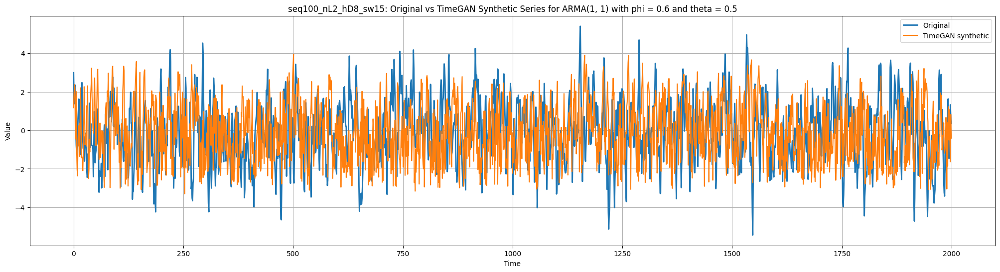

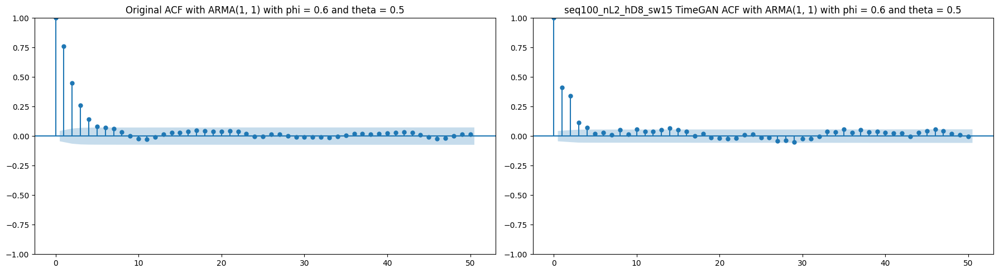

In [51]:
try_timegan_setting(
    seriesName = 'ARMA(1, 1) with phi = 0.6 and theta = 0.5',
    experimentName = 'seq100_nL2_hD8_sw15',
    updates = {
        'seqLen': 100,
        'numLayers': 2,
        'hiddenDim': 8,
        'supervisedWeight': 15
    }
)

Training seq100_nL2_hD8_sw5 for ARMA(1, 1) with phi = 0.6 and theta = 0.5
TimeGAN input series: ARMA(1, 1) with phi = 0.6 and theta = 0.5
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 8, 'numLayers': 2, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 5, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 1.017549
Embedder iteration 100, loss: 0.129103
Embedder iteration 200, loss: 0.010405
Embedder iteration 300, loss: 0.003924
Embedder iteration 400, loss: 0.002408
Embedder iteration 500, loss: 0.002318
Embedder iteration 600, loss: 0.001328
Embedder iteration 700, loss: 0.001692
Embedder iteration 800, loss: 0.000916
Embedder iteration 900, loss: 0.000853
Supervisor iteration 0, loss: 0.537420
Supervisor iteration 100, loss: 0.061211
Supervisor iteration 200, loss: 0.034644
Supervisor iteration 300, loss: 0.

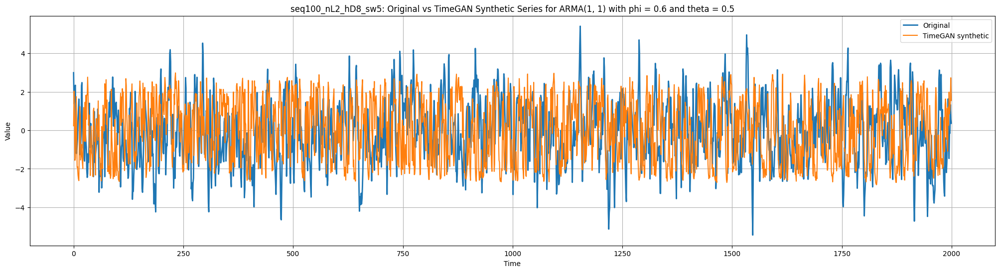

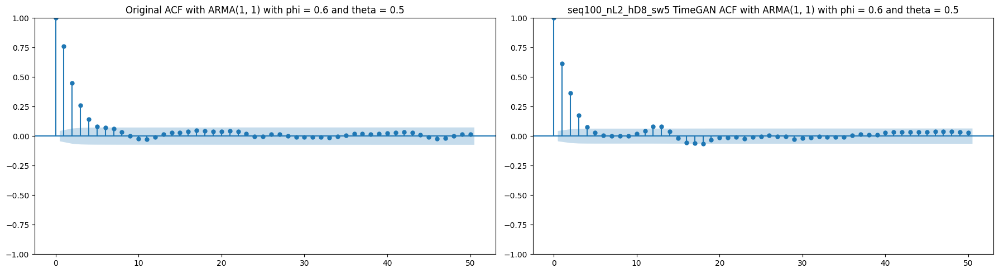

In [52]:
try_timegan_setting(
    seriesName = 'ARMA(1, 1) with phi = 0.6 and theta = 0.5',
    experimentName = 'seq100_nL2_hD8_sw5',
    updates = {
        'seqLen': 100,
        'numLayers': 2,
        'hiddenDim': 8,
        'supervisedWeight': 5
    }
)

Training seq100_hD8_sw5 for ARMA(1, 1) with phi = 0.6 and theta = 0.5
TimeGAN input series: ARMA(1, 1) with phi = 0.6 and theta = 0.5
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 8, 'numLayers': 1, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 5, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 1.134175
Embedder iteration 100, loss: 0.288854
Embedder iteration 200, loss: 0.026426
Embedder iteration 300, loss: 0.010874
Embedder iteration 400, loss: 0.005661
Embedder iteration 500, loss: 0.003663
Embedder iteration 600, loss: 0.002454
Embedder iteration 700, loss: 0.002203
Embedder iteration 800, loss: 0.001345
Embedder iteration 900, loss: 0.001223
Supervisor iteration 0, loss: 0.404239
Supervisor iteration 100, loss: 0.217552
Supervisor iteration 200, loss: 0.112393
Supervisor iteration 300, loss: 0.0640

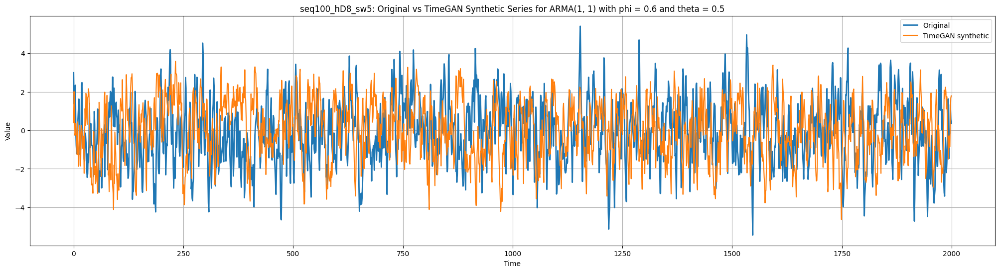

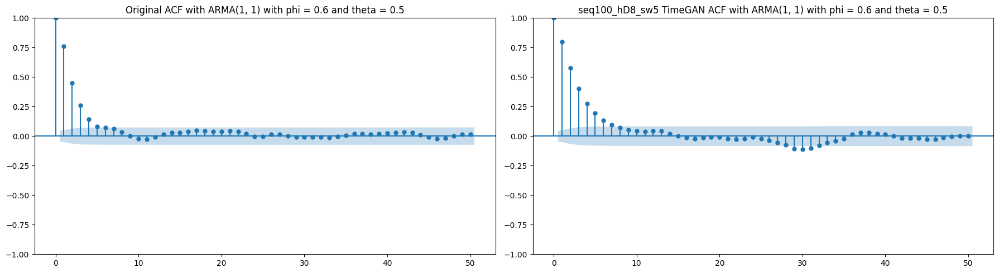

In [53]:
try_timegan_setting(
    seriesName = 'ARMA(1, 1) with phi = 0.6 and theta = 0.5',
    experimentName = 'seq100_hD8_sw5',
    updates = {
        'seqLen': 100,
        'hiddenDim': 8,
        'supervisedWeight': 5
    }
)

Training seq100_nL2_hD8 for ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2
TimeGAN input series: ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 8, 'numLayers': 2, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 10, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 0.826247
Embedder iteration 100, loss: 0.133929
Embedder iteration 200, loss: 0.015223
Embedder iteration 300, loss: 0.006752
Embedder iteration 400, loss: 0.003598
Embedder iteration 500, loss: 0.002294
Embedder iteration 600, loss: 0.001706
Embedder iteration 700, loss: 0.001726
Embedder iteration 800, loss: 0.001905
Embedder iteration 900, loss: 0.000716
Supervisor iteration 0, loss: 0.317499
Supervisor iteration 100, loss: 0.057053
Supervisor iteration 200, loss: 0.013633
Supervi

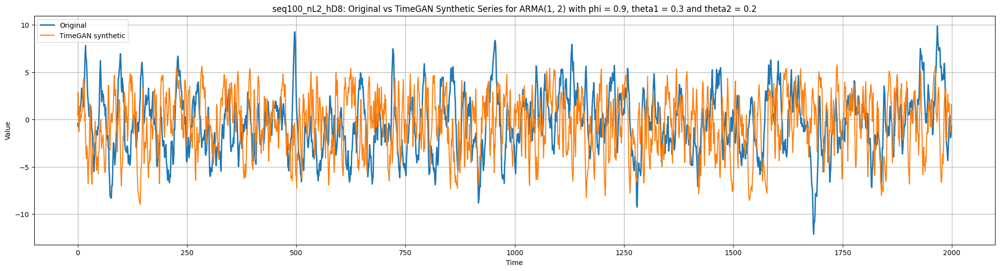

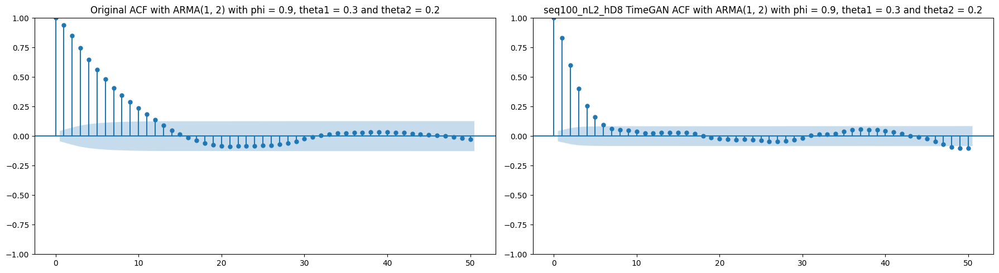

In [54]:
try_timegan_setting(
    seriesName = 'ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2',
    experimentName = 'seq100_nL2_hD8',
    updates = {
        'seqLen': 100,
        'numLayers': 2,
        'hiddenDim': 8
    }
)

Training seq100_hD16 for ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2
TimeGAN input series: ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 16, 'numLayers': 1, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 10, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 0.846545
Embedder iteration 100, loss: 0.038540
Embedder iteration 200, loss: 0.004927
Embedder iteration 300, loss: 0.002705
Embedder iteration 400, loss: 0.001494
Embedder iteration 500, loss: 0.001151
Embedder iteration 600, loss: 0.000679
Embedder iteration 700, loss: 0.000694
Embedder iteration 800, loss: 0.000938
Embedder iteration 900, loss: 0.000280
Supervisor iteration 0, loss: 0.479076
Supervisor iteration 100, loss: 0.089747
Supervisor iteration 200, loss: 0.020368
Superviso

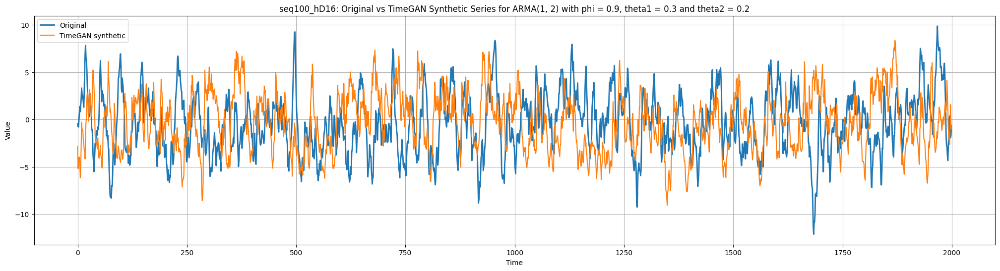

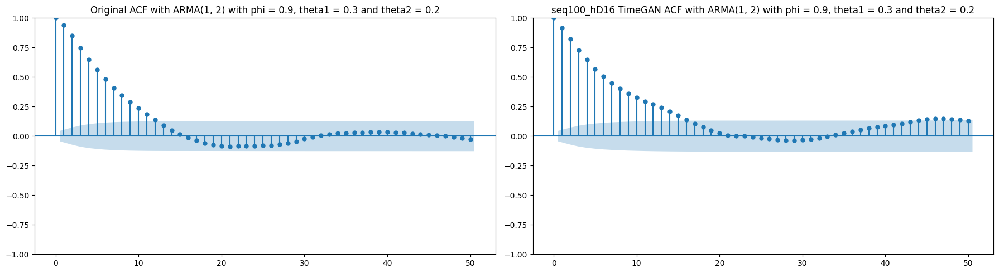

In [55]:
try_timegan_setting(
    seriesName = 'ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2',
    experimentName = 'seq100_hD16',
    updates = {
        'seqLen': 100,
        'hiddenDim': 16
    }
)

Training seq100_nL3 for Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
TimeGAN input series: Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 3, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 10, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 0.993757
Embedder iteration 100, loss: 0.024511
Embedder iteration 200, loss: 0.005520
Embedder iteration 300, loss: 0.002643
Embedder iteration 400, loss: 0.001951
Embedder iteration 500, loss: 0.001123
Embedder iteration 600, loss: 0.001004
Embedder iteration 700, loss: 0.000475
Embedder iteration 800, loss: 0.000480
Embedder iteration 900, loss: 0.000343
Supervisor iteration 0, loss: 0.285038
Supervisor iteration 100, loss: 0.027112
Supervisor iteration 200, loss: 0.025091
Su

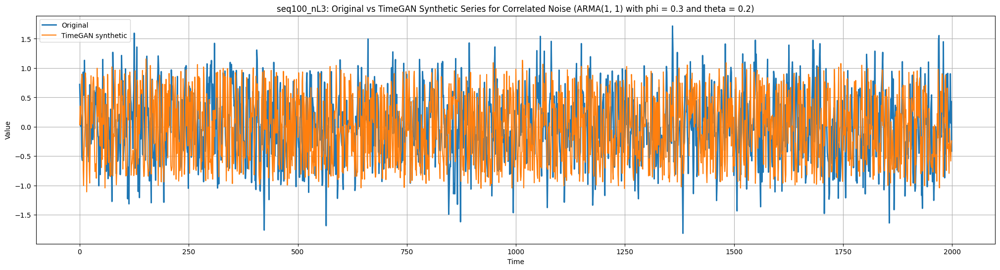

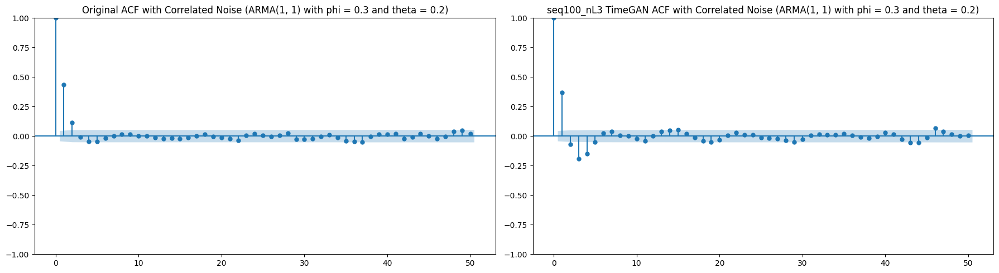

In [57]:
try_timegan_setting(
    seriesName = 'Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)',
    experimentName = 'seq100_nL3',
    updates = {
        'seqLen': 100,
        'numLayers': 3
    }
)

Training seq100_nL3 for ARMA(1, 1) with phi = 0.6 and theta = 0.5
TimeGAN input series: ARMA(1, 1) with phi = 0.6 and theta = 0.5
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 3, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 10, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 0.992107
Embedder iteration 100, loss: 0.036267
Embedder iteration 200, loss: 0.005091
Embedder iteration 300, loss: 0.002438
Embedder iteration 400, loss: 0.001632
Embedder iteration 500, loss: 0.001409
Embedder iteration 600, loss: 0.000712
Embedder iteration 700, loss: 0.001007
Embedder iteration 800, loss: 0.000540
Embedder iteration 900, loss: 0.000551
Supervisor iteration 0, loss: 0.437146
Supervisor iteration 100, loss: 0.030008
Supervisor iteration 200, loss: 0.021890
Supervisor iteration 300, loss: 0.017997

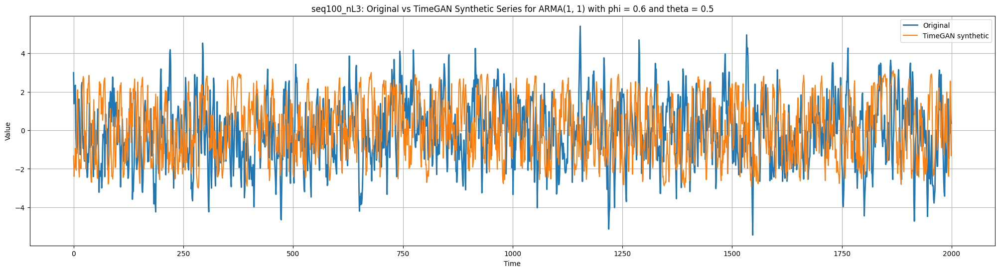

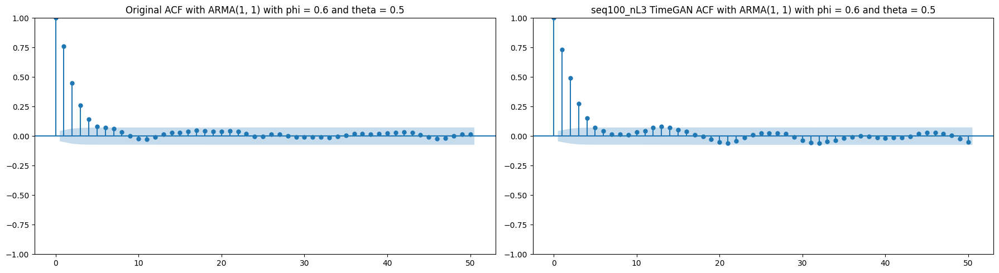

In [58]:
try_timegan_setting(
    seriesName = 'ARMA(1, 1) with phi = 0.6 and theta = 0.5',
    experimentName = 'seq100_nL3',
    updates = {
        'seqLen': 100,
        'numLayers': 3
    }
)

Training seq100_nL3 for ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2
TimeGAN input series: ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 3, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 10, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 0.905484
Embedder iteration 100, loss: 0.035008
Embedder iteration 200, loss: 0.007190
Embedder iteration 300, loss: 0.004278
Embedder iteration 400, loss: 0.002524
Embedder iteration 500, loss: 0.001466
Embedder iteration 600, loss: 0.000984
Embedder iteration 700, loss: 0.001113
Embedder iteration 800, loss: 0.001062
Embedder iteration 900, loss: 0.000288
Supervisor iteration 0, loss: 0.448905
Supervisor iteration 100, loss: 0.016877
Supervisor iteration 200, loss: 0.010354
Supervisor

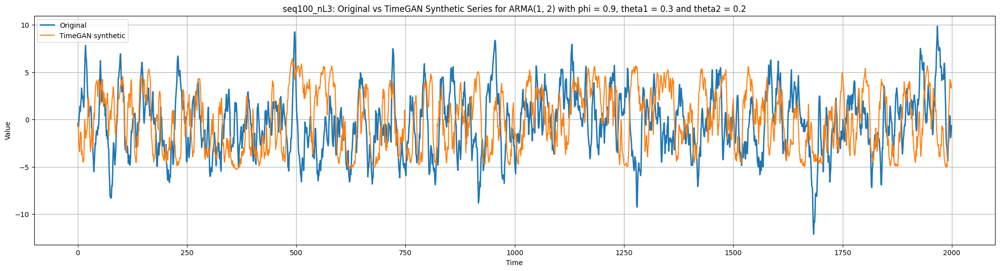

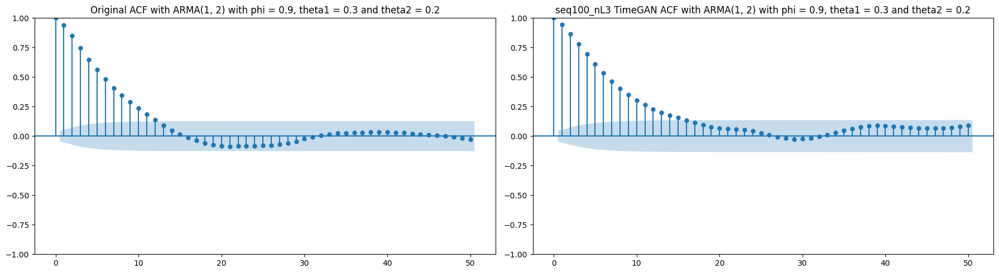

In [59]:
try_timegan_setting(
    seriesName = 'ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2',
    experimentName = 'seq100_nL3',
    updates = {
        'seqLen': 100,
        'numLayers': 3
    }
)

Trend + Seasonality
TimeGAN input: Correlated Noise
Original mean: 6.00036198070481
Synthetic mean: 5.971509299499216

Original std: 3.73392019487072
Synthetic std: 3.7589923791164983

Original variance: 13.942160021663396
Synthetic variance: 14.130023706255914

Original min/max: -2.380971732399037 14.66870745102812
Synthetic min/max: -2.6445313540237487 14.406049665524293

Original lag 1 ACF: 0.9852918376593801
Synthetic lag 1 ACF: 0.9830820097533093
ACF error: 0.00391558976035016


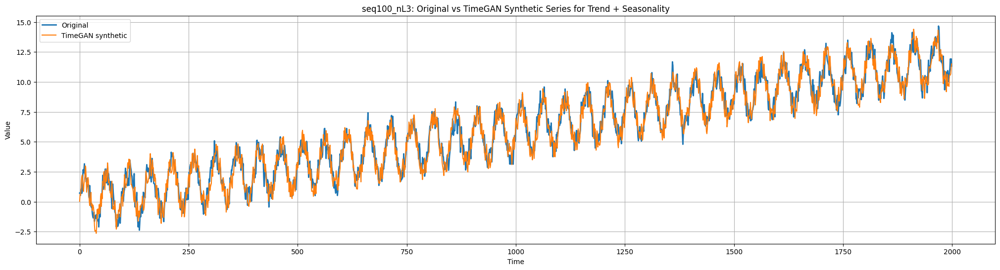

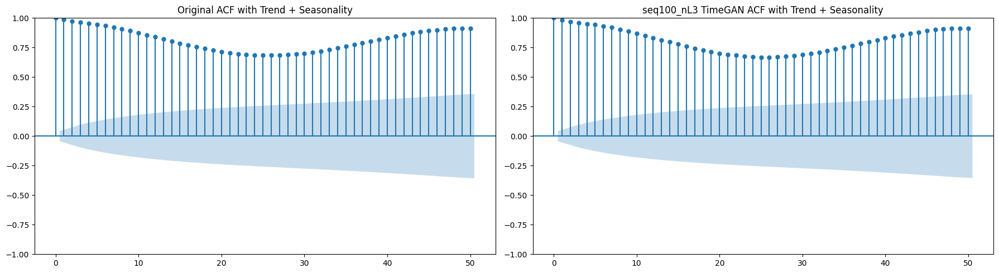

In [60]:
show_timegan_result(
    experimentName = 'seq100_nL3',
    seriesName = 'Trend + Seasonality'
)

In [61]:
for key in timeganResults.keys():
  print(key)

('main', 'Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)')
('main', 'ARMA(1, 1) with phi = 0.6 and theta = 0.5')
('main', 'ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2')
('main', 'Trend + Seasonality')
('seq100', 'ARMA(1, 1) with phi = 0.6 and theta = 0.5')
('seq100', 'ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2')
('seq100_sw5', 'ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2')
('seq100_hD8', 'ARMA(1, 1) with phi = 0.6 and theta = 0.5')
('seq100_nL2_hD8', 'Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)')
('seq100_nL2_hD8', 'Trend + Seasonality')
('seq100_nL2_hD8', 'ARMA(1, 1) with phi = 0.6 and theta = 0.5')
('seq100_nL2_hD16_sw5', 'Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)')
('seq100_nL2_hD16_sw5', 'Trend + Seasonality')
('seq100_nL2_hD16_sw15', 'Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)')
('seq100_nL2_hD16_sw15', 'Trend + Seasonality')
('seq100_nL2_hD8_sw15', 'ARMA(1, 1) with phi = 0.

In [62]:
#Extract all defined updates and the main result
timeganCandidateKeys = list(timeganResults.keys())

#Number of monte carlo samples
B = 500

#A dictionary to store generated samples for each experiment and series
TimeGANsamplesAll = {}

for experimentName, seriesName in timeganCandidateKeys:

  # Trend + Seasonality is created from correlated noise, so it is skipped here
  if seriesName == "Trend + Seasonality":
    continue

  print("=" * 100)
  print("Generating samples for:", experimentName, seriesName)
  print("=" * 100)

  result = timeganResults[(experimentName, seriesName)]
  settings = result['settings']

  #Using a function defined in timegan_utils.py to generate samples based on trained model
  samples = generate_timegan_samples(
      models = result['models'],
      scaler = result['scaler'],
      B = B,
      outputlength = n,
      zDim = settings['zDim'],
      noiseType = settings['noiseType']
  )

  # Storing the generated samples
  TimeGANsamplesAll[(experimentName, seriesName)] = samples

  # If the generated series is correlated noise, use it to obtain Trend + Seasonality
  if seriesName == noiseName:
    syntheticTrendSeasonalSamples = samples + trend + seasonality
    TimeGANsamplesAll[(experimentName, "Trend + Seasonality")] = syntheticTrendSeasonalSamples

rows = []

for experimentName, seriesName in TimeGANsamplesAll.keys():

    samples = TimeGANsamplesAll[(experimentName, seriesName)]
    original = originalSeries[seriesName]

    if seriesName == "Trend + Seasonality":
        result = timeganResults[(experimentName, noiseName)]
        timeganInput = "Correlated Noise"
    else:
        result = timeganResults[(experimentName, seriesName)]
        timeganInput = result['TimeGAN input']

    settings = result["settings"]

    meanErrors = []
    varianceErrors = []
    acfErrors = []

    for sample in samples:
        meanErrors.append(mean_error(original, sample))
        varianceErrors.append(variance_error(original, sample))
        acfErrors.append(acf_error(original, sample, maxLag = maxLag))

    meanACF, acfCI = monte_carlo_ci(acfErrors)
    meanMeanError, meanErrorCI = monte_carlo_ci(meanErrors)
    meanVarianceError, varianceErrorCI = monte_carlo_ci(varianceErrors)

    #Showing Tuning details and result
    rows.append({
        "Method": "TimeGAN",
        "Experiment": experimentName,
        "Series": seriesName,
        "Tuning": (
            f'seqLen = {settings["seqLen"]}, '
            f'hD = {settings["hiddenDim"]}, '
            f'nL = {settings["numLayers"]}, '
            f'zDim = {settings["zDim"]}, '
            f'sw = {settings["supervisedWeight"]}, '
            f'mw = {settings["momentWeight"]}, '
            f'input = {timeganInput}'
        ),
        "mean_acf_error": meanACF,
        "acf_error_95ci": acfCI,
        "mean_error_mean": meanMeanError,
        "mean_error_95ci": meanErrorCI,
        "variance_error_mean": meanVarianceError,
        "variance_error_95ci": varianceErrorCI
    })

TimeGANTuningSummary = pd.DataFrame(rows)

TimeGANTuningSummary.sort_values(["Series", "mean_acf_error"])

Generating samples for: main Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
Generating samples for: main ARMA(1, 1) with phi = 0.6 and theta = 0.5
Generating samples for: main ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2
Generating samples for: seq100 ARMA(1, 1) with phi = 0.6 and theta = 0.5
Generating samples for: seq100 ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2
Generating samples for: seq100_sw5 ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2
Generating samples for: seq100_hD8 ARMA(1, 1) with phi = 0.6 and theta = 0.5
Generating samples for: seq100_nL2_hD8 Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
Generating samples for: seq100_nL2_hD8 ARMA(1, 1) with phi = 0.6 and theta = 0.5
Generating samples for: seq100_nL2_hD16_sw5 Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
Generating samples for: seq100_nL2_hD16_sw15 Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
Generating samples for: seq100_

,Method,Experiment,Series,Tuning,mean_acf_error,acf_error_95ci,mean_error_mean,mean_error_95ci,variance_error_mean,variance_error_95ci
22,TimeGAN,seq100_nL3,"ARMA(1, 1) with phi = 0.6 and theta = 0.5","seqLen = 100, hD = 12, nL = 3, zDim = 5, sw = ...",0.1000,"[0.0965, 0.1035]",0.0633,"[0.0592, 0.0673]",0.1142,"[0.1081, 0.1203]"
16,TimeGAN,seq100_nL2_hD8_sw5,"ARMA(1, 1) with phi = 0.6 and theta = 0.5","seqLen = 100, hD = 8, nL = 2, zDim = 5, sw = 5...",0.1102,"[0.1072, 0.1132]",0.0622,"[0.0579, 0.0664]",0.0739,"[0.0693, 0.0785]"
2,TimeGAN,main,"ARMA(1, 1) with phi = 0.6 and theta = 0.5","seqLen = 50, hD = 12, nL = 1, zDim = 5, sw = 1...",0.1203,"[0.1175, 0.1232]",0.0563,"[0.0525, 0.0601]",0.0860,"[0.0807, 0.0912]"
4,TimeGAN,seq100,"ARMA(1, 1) with phi = 0.6 and theta = 0.5","seqLen = 100, hD = 12, nL = 1, zDim = 5, sw = ...",0.1432,"[0.1384, 0.1481]",0.1335,"[0.1264, 0.1405]",0.1308,"[0.1228, 0.1388]"
15,TimeGAN,seq100_nL2_hD8_sw15,"ARMA(1, 1) with phi = 0.6 and theta = 0.5","seqLen = 100, hD = 8, nL = 2, zDim = 5, sw = 1...",0.1829,"[0.1797, 0.186]",0.0913,"[0.0864, 0.0962]",0.0935,"[0.0877, 0.0993]"
17,TimeGAN,seq100_hD8_sw5,"ARMA(1, 1) with phi = 0.6 and theta = 0.5","seqLen = 100, hD = 8, nL = 1, zDim = 5, sw = 5...",0.3080,"[0.2987, 0.3174]",0.1051,"[0.0986, 0.1116]",0.1488,"[0.1396, 0.1581]"
10,TimeGAN,seq100_nL2_hD8,"ARMA(1, 1) with phi = 0.6 and theta = 0.5","seqLen = 100, hD = 8, nL = 2, zDim = 5, sw = 1...",0.4032,"[0.3993, 0.407]",0.0778,"[0.0737, 0.0819]",0.0485,"[0.0454, 0.0517]"
7,TimeGAN,seq100_hD8,"ARMA(1, 1) with phi = 0.6 and theta = 0.5","seqLen = 100, hD = 8, nL = 1, zDim = 5, sw = 1...",0.6315,"[0.6278, 0.6353]",0.0381,"[0.0355, 0.0407]",0.0417,"[0.0392, 0.0442]"
23,TimeGAN,seq100_nL3,"ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and th...","seqLen = 100, hD = 12, nL = 3, zDim = 5, sw = ...",0.3057,"[0.2881, 0.3232]",0.2266,"[0.2113, 0.2419]",0.4798,"[0.4479, 0.5116]"
6,TimeGAN,seq100_sw5,"ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and th...","seqLen = 100, hD = 12, nL = 1, zDim = 5, sw = ...",0.3268,"[0.3119, 0.3417]",0.2231,"[0.2088, 0.2373]",0.6115,"[0.5729, 0.65]"


In [63]:
#Choosing the best settings of parameters
TimeGANBestSummary = (
    TimeGANTuningSummary.sort_values('mean_acf_error')
    .groupby("Series", as_index=False).first()
)

TimeGANBestSummary

,Series,Method,Experiment,Tuning,mean_acf_error,acf_error_95ci,mean_error_mean,mean_error_95ci,variance_error_mean,variance_error_95ci
0,"ARMA(1, 1) with phi = 0.6 and theta = 0.5",TimeGAN,seq100_nL3,"seqLen = 100, hD = 12, nL = 3, zDim = 5, sw = ...",0.1000,"[0.0965, 0.1035]",0.0633,"[0.0592, 0.0673]",0.1142,"[0.1081, 0.1203]"
1,"ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and th...",TimeGAN,seq100_nL3,"seqLen = 100, hD = 12, nL = 3, zDim = 5, sw = ...",0.3057,"[0.2881, 0.3232]",0.2266,"[0.2113, 0.2419]",0.4798,"[0.4479, 0.5116]"
2,"Correlated Noise (ARMA(1, 1) with phi = 0.3 an...",TimeGAN,seq100_nL2_hD16_sw15,"seqLen = 100, hD = 16, nL = 2, zDim = 5, sw = ...",0.0552,"[0.054, 0.0564]",0.0169,"[0.0158, 0.018]",0.0054,"[0.0051, 0.0058]"
3,Trend + Seasonality,TimeGAN,main,"seqLen = 50, hD = 12, nL = 1, zDim = 5, sw = 1...",0.0011,"[0.001, 0.0013]",0.0247,"[0.0234, 0.026]",0.1540,"[0.1449, 0.1631]"


In [64]:
def plot_timegan_acf_result(experimentName, seriesName, maxLag = 50):

    #Extracting TimeGAN samples that we generated
    samples = TimeGANsamplesAll[(experimentName, seriesName)]

    original = originalSeries[seriesName]
    originalACF = acf_values(original, maxLag=maxLag)

    #Computing ACF values for all generated samples
    samplesACF = compute_acf_for_samples(samples, maxLag = maxLag)

    meanACF = np.mean(samplesACF, axis=0)
    lowerACF = np.percentile(samplesACF, 2.5, axis=0)
    upperACF = np.percentile(samplesACF, 97.5, axis=0)

    lags = np.arange(maxLag + 1)

    #Plotting original ACF, mean synthetic ACF, and 95% range
    fig, ax = plt.subplots(1, 1, figsize=(22, 6))

    ax.plot(lags, originalACF, color="blue", linewidth = 2, label="Original")
    ax.plot(lags, meanACF, color="red", linewidth = 2, label = "Mean TimeGAN synthetic")
    ax.fill_between(lags, lowerACF, upperACF, color="gray", alpha=0.2, label="95% range of TimeGAN ACF")

    ax.axhline(0, color="gray", linestyle="--", linewidth=1)
    ax.set_title(f"ACF comparison for {seriesName}, TimeGAN: {experimentName}")
    ax.set_xlabel("Lag")
    ax.set_ylabel("ACF Value")
    ax.legend(loc="upper right")

    plt.tight_layout()
    plt.show()

In [65]:
def plot_best_timegan_acf_result(seriesName, maxLag=50):

    #Extracting TimeGAN results for each series that we're interested in
    candidates = TimeGANTuningSummary[TimeGANTuningSummary["Series"] == seriesName]

    # Choosing the experiment with the smallest mean ACF error
    bestIndex = candidates['mean_acf_error'].idxmin()
    experimentName = candidates.loc[bestIndex, 'Experiment']

    print("Best experiment:", experimentName)
    print("Mean ACF error:", candidates.loc[bestIndex, 'mean_acf_error'])

    plot_timegan_acf_result(
        experimentName = experimentName,
        seriesName = seriesName,
        maxLag = maxLag
    )

Best experiment: seq100_nL3
Mean ACF error: 0.1


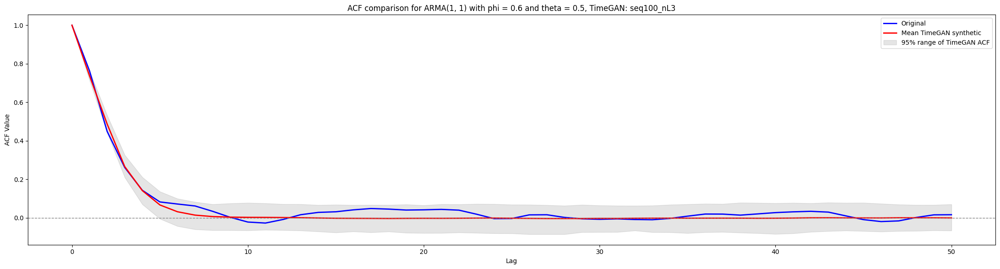

In [66]:
plot_best_timegan_acf_result("ARMA(1, 1) with phi = 0.6 and theta = 0.5")

Best experiment: seq100_nL3
Mean ACF error: 0.3057


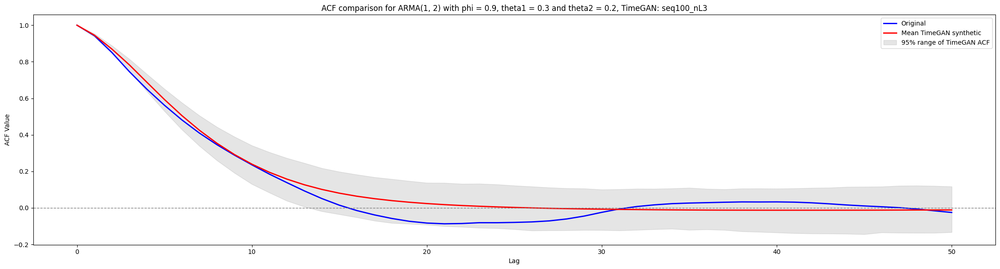

In [67]:
plot_best_timegan_acf_result("ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and theta2 = 0.2")

Best experiment: seq100_nL2_hD16_sw15
Mean ACF error: 0.0552


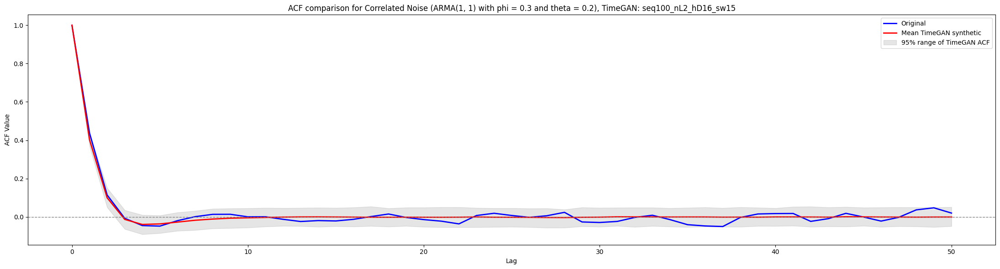

In [68]:
plot_best_timegan_acf_result("Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)")

Best experiment: main
Mean ACF error: 0.0011


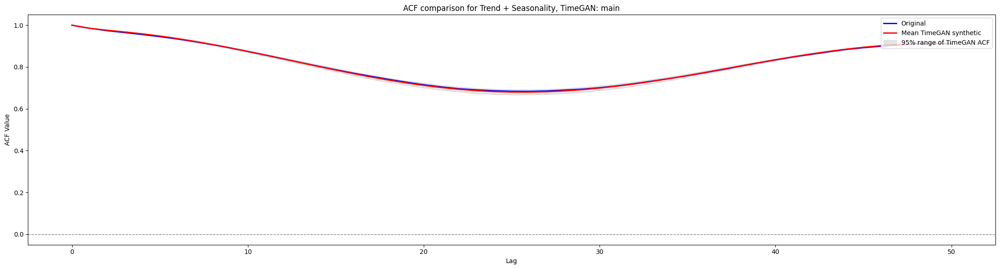

In [69]:
plot_best_timegan_acf_result("Trend + Seasonality")

In [70]:
TimeGANSummary = TimeGANBestSummary.copy()

TimeGANSummary = TimeGANSummary.drop(columns=["Experiment"])

TimeGANSummary

,Series,Method,Tuning,mean_acf_error,acf_error_95ci,mean_error_mean,mean_error_95ci,variance_error_mean,variance_error_95ci
0,"ARMA(1, 1) with phi = 0.6 and theta = 0.5",TimeGAN,"seqLen = 100, hD = 12, nL = 3, zDim = 5, sw = ...",0.1000,"[0.0965, 0.1035]",0.0633,"[0.0592, 0.0673]",0.1142,"[0.1081, 0.1203]"
1,"ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and th...",TimeGAN,"seqLen = 100, hD = 12, nL = 3, zDim = 5, sw = ...",0.3057,"[0.2881, 0.3232]",0.2266,"[0.2113, 0.2419]",0.4798,"[0.4479, 0.5116]"
2,"Correlated Noise (ARMA(1, 1) with phi = 0.3 an...",TimeGAN,"seqLen = 100, hD = 16, nL = 2, zDim = 5, sw = ...",0.0552,"[0.054, 0.0564]",0.0169,"[0.0158, 0.018]",0.0054,"[0.0051, 0.0058]"
3,Trend + Seasonality,TimeGAN,"seqLen = 50, hD = 12, nL = 1, zDim = 5, sw = 1...",0.0011,"[0.001, 0.0013]",0.0247,"[0.0234, 0.026]",0.1540,"[0.1449, 0.1631]"


In [71]:
finalSummary = pd.concat(
    [mbbSummary, SieveSummary, TimeGANSummary],
    ignore_index = True
)

#Displaying by series and from lowest mean acf error
finalSummary.sort_values(['Series', 'mean_acf_error'])

,Method,Tuning,Series,mean_acf_error,acf_error_95ci,mean_error_mean,mean_error_95ci,variance_error_mean,variance_error_95ci
13,Moving Block Bootstrap,block size = 100,"ARMA(1, 1) with phi = 0.6 and theta = 0.5",0.0637,"[0.0612, 0.0662]",0.0658,"[0.0612, 0.0704]",0.0907,"[0.0844, 0.0969]"
17,Sieve Bootstrap,p = 50 selected by AIC,"ARMA(1, 1) with phi = 0.6 and theta = 0.5",0.0669,"[0.0642, 0.0695]",0.0691,"[0.0645, 0.0738]",0.1064,"[0.0988, 0.1139]"
9,Moving Block Bootstrap,block size = 50,"ARMA(1, 1) with phi = 0.6 and theta = 0.5",0.0697,"[0.067, 0.0725]",0.0651,"[0.0608, 0.0694]",0.1011,"[0.0944, 0.1078]"
5,Moving Block Bootstrap,block size = 20,"ARMA(1, 1) with phi = 0.6 and theta = 0.5",0.0876,"[0.0846, 0.0906]",0.0620,"[0.0581, 0.066]",0.1051,"[0.0983, 0.112]"
21,Sieve Bootstrap,p = 5 selected by BIC,"ARMA(1, 1) with phi = 0.6 and theta = 0.5",0.0916,"[0.0883, 0.095]",0.0648,"[0.0605, 0.0692]",0.1140,"[0.1067, 0.1213]"
24,TimeGAN,"seqLen = 100, hD = 12, nL = 3, zDim = 5, sw = ...","ARMA(1, 1) with phi = 0.6 and theta = 0.5",0.1000,"[0.0965, 0.1035]",0.0633,"[0.0592, 0.0673]",0.1142,"[0.1081, 0.1203]"
1,Moving Block Bootstrap,block size = 10,"ARMA(1, 1) with phi = 0.6 and theta = 0.5",0.1091,"[0.106, 0.1122]",0.0585,"[0.0545, 0.0624]",0.0978,"[0.091, 0.1047]"
18,Sieve Bootstrap,p = 50 selected by AIC,"ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and th...",0.1657,"[0.1545, 0.1769]",0.1898,"[0.1769, 0.2026]",0.7792,"[0.7286, 0.8298]"
14,Moving Block Bootstrap,block size = 100,"ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and th...",0.1875,"[0.1757, 0.1993]",0.1930,"[0.1807, 0.2053]",0.6609,"[0.6194, 0.7024]"
10,Moving Block Bootstrap,block size = 50,"ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and th...",0.2038,"[0.1934, 0.2141]",0.1914,"[0.1788, 0.2039]",0.6939,"[0.6492, 0.7386]"


In [72]:
#Displaying the method which resulted in smallest acf error
bestSummary = finalSummary.sort_values("mean_acf_error").groupby("Series", as_index = False).first()

bestSummary = bestSummary.sort_values("Series")

bestSummary

,Series,Method,Tuning,mean_acf_error,acf_error_95ci,mean_error_mean,mean_error_95ci,variance_error_mean,variance_error_95ci
0,"ARMA(1, 1) with phi = 0.6 and theta = 0.5",Moving Block Bootstrap,block size = 100,0.0637,"[0.0612, 0.0662]",0.0658,"[0.0612, 0.0704]",0.0907,"[0.0844, 0.0969]"
1,"ARMA(1, 2) with phi = 0.9, theta1 = 0.3 and th...",Sieve Bootstrap,p = 50 selected by AIC,0.1657,"[0.1545, 0.1769]",0.1898,"[0.1769, 0.2026]",0.7792,"[0.7286, 0.8298]"
2,"Correlated Noise (ARMA(1, 1) with phi = 0.3 an...",Sieve Bootstrap,p = 48 selected by AIC,0.0357,"[0.0347, 0.0366]",0.0127,"[0.0118, 0.0136]",0.0097,"[0.009, 0.0104]"
3,Trend + Seasonality,TimeGAN,"seqLen = 50, hD = 12, nL = 1, zDim = 5, sw = 1...",0.0011,"[0.001, 0.0013]",0.0247,"[0.0234, 0.026]",0.1540,"[0.1449, 0.1631]"


Two sample t-test (Unpooled) about acf errors

In [73]:
#The function which computes the acf error for each 500 synthetic sample
def get_acf_error_array(original, samples, maxLag = 50):
  acfErrors = []

  #Storing acf error of each synthetic data
  for sample in samples:
    acfErrors.append(acf_error(original, sample, maxLag = maxLag))

  return np.array(acfErrors)

In [74]:
def welch_acf_test(errorsMethod, errorsTimeGAN, methodName):
  meanMethod = np.mean(errorsMethod)
  meanTimeGAN = np.mean(errorsTimeGAN)

  meanDifference = meanMethod - meanTimeGAN

  # Sample size
  nMethod = len(errorsMethod)
  nTimeGAN = len(errorsTimeGAN)

  # Sample variance
  varMethod = np.var(errorsMethod, ddof = 1)
  varTimeGAN = np.var(errorsTimeGAN, ddof = 1)

  # Standard error for the difference in means
  seDifference = np.sqrt(varMethod / nMethod + varTimeGAN / nTimeGAN)

  #Degrees of freedom
  numerator = (varMethod / nMethod + varTimeGAN / nTimeGAN) ** 2
  denominator = ((varMethod / nMethod) ** 2 / (nMethod - 1)) + ((varTimeGAN / nTimeGAN) ** 2 / (nTimeGAN - 1))
  degreesFreedom = numerator / denominator

  # 95% confidence interval for the mean difference
  tCritical = stats.t.ppf(0.975, degreesFreedom)
  lowerCI = meanDifference - tCritical * seDifference
  upperCI = meanDifference + tCritical * seDifference

  #One sided two sample t-test (Unpooled t-test)
  #Ha: The statistical method has smaller mean ACF error than TimeGAN
  testResult = stats.ttest_ind(errorsMethod, errorsTimeGAN, equal_var = False, alternative = 'less')

  #Printint out the result
  print(methodName, "and TimeGAN")
  print("Mean ACF error of", methodName, ":", meanMethod)
  print("Mean ACF error of TimeGAN:", meanTimeGAN)
  print("Mean difference:", meanDifference)
  print("95% CI for mean difference:", [float(lowerCI), float(upperCI)])
  print("p-value:", testResult.pvalue)

  if testResult.pvalue < 0.05:
    print('Result: There is sufficient evidence to conclude that', methodName, 'has smaller mean ACF error than TimeGAN')
  else:
    print('Result: There is no sufficient evidence to conclude that', methodName, 'has smaller mean ACF error than TimeGAN')

  print()

The mean ACF error of series with trend and seasonality is significantly influenced by the deterministic component. The poor performance on the noise component does not necessarily indicate the better performance on the final series with trend and seasonality (for example, block size = 10 in MBB, or TimeGAN in this methods comparison)
This example is presented on the next notebook on Kobe temperature data. The quality of synthetic data is evaluated by predictive performance.

In [75]:
for seriesName in seriesNames:

  print("=" * 100)
  print(seriesName)
  print("=" * 100)

  original = originalSeries[seriesName]

  #Best TimeGAN, MBB, Sieve for this series
  bestTimeGANRow = (TimeGANTuningSummary[TimeGANTuningSummary["Series"] == seriesName].sort_values('mean_acf_error').iloc[0])
  bestMbbRow = (mbbSummary[mbbSummary["Series"] == seriesName].sort_values('mean_acf_error').iloc[0])
  bestSieveRow = (SieveSummary[SieveSummary["Series"] == seriesName].sort_values('mean_acf_error').iloc[0])

  #Getting the experiment setting which had lowest ACF error and those acf errors as numpy array
  timeganExperiment = bestTimeGANRow['Experiment']
  timeganSamples = TimeGANsamplesAll[(timeganExperiment, seriesName)]
  timeganErrors = get_acf_error_array(original, timeganSamples, maxLag = maxLag)

  #block size shoule be mostly 100 from repeated experiments
  mbbTuning = bestMbbRow['Tuning']
  blockSize = int(mbbTuning.replace('block size = ', ''))
  mbbSamples = MBBsamplesAll[blockSize][seriesName]
  mbbErrors = get_acf_error_array(original, mbbSamples, maxLag = maxLag)

  #Welch's t-test for MBB and TimeGAN
  print("Best MBB tuning:", mbbTuning)
  print("Best TimeGAN experiment:", timeganExperiment)
  welch_acf_test(mbbErrors, timeganErrors, "Moving Block Bootstrap")

  sieveTuning = bestSieveRow["Tuning"]
  criterion = sieveTuning.split("selected by ")[1]

  sieveSamples = SIEVEsamplesAll[criterion][seriesName]
  sieveErrors = get_acf_error_array(original, sieveSamples, maxLag=maxLag)

  #Welch's t-test for Sieve and TimeGAN
  print("Best Sieve tuning:", sieveTuning)
  print("Best TimeGAN experiment:", timeganExperiment)
  welch_acf_test(sieveErrors, timeganErrors, "Sieve Bootstrap")

Correlated Noise (ARMA(1, 1) with phi = 0.3 and theta = 0.2)
Best MBB tuning: block size = 100
Best TimeGAN experiment: seq100_nL2_hD16_sw15
Moving Block Bootstrap and TimeGAN
Mean ACF error of Moving Block Bootstrap : 0.03926007821126374
Mean ACF error of TimeGAN: 0.055181399324472184
Mean difference: -0.015921321113208445
95% CI for mean difference: [-0.017605998574206326, -0.014236643652210564]
p-value: 1.807681539563446e-66
Result: There is sufficient evidence to conclude that Moving Block Bootstrap has smaller mean ACF error than TimeGAN

Best Sieve tuning: p = 48 selected by AIC
Best TimeGAN experiment: seq100_nL2_hD16_sw15
Sieve Bootstrap and TimeGAN
Mean ACF error of Sieve Bootstrap : 0.03567466610914423
Mean ACF error of TimeGAN: 0.055181399324472184
Mean difference: -0.019506733215327955
95% CI for mean difference: [-0.021047812080684975, -0.017965654349970935]
p-value: 3.3744693977998506e-105
Result: There is sufficient evidence to conclude that Sieve Bootstrap has smaller m